In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,recall_score,precision_score,confusion_matrix,f1_score
from keras.models import Sequential
from keras.layers import LSTM, Embedding,BatchNormalization, Dense, Dropout, Bidirectional, Flatten, GlobalMaxPool1D
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from sklearn.linear_model import LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.metrics import f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
import time
import re
import string
%matplotlib inline
from collections import Counter
import nltk
from nltk.corpus import stopwords
from tqdm import tqdm
import nltk
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression
import lime
import lime.lime_text
from bs4 import BeautifulSoup
from nltk.tokenize import word_tokenize

import lime
from lime import lime_tabular
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
import emoji

from wordcloud import WordCloud
 
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import shap
from sklearn.metrics import roc_curve,auc
from sklearn.pipeline import Pipeline

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


## CSV file 

In [209]:
keras.__version__

'2.15.0'

In [2]:
df=pd.read_csv("TubeSpam.csv")

In [3]:
df

,COMMENT_ID,AUTHOR,DATE,CONTENT,CLASS
0,LZQPQhLyRh80UYxNuaDWhIGQYNQ96IuCg-AYWqNPjpU,Julius NM,2013-11-07T06:20:48,"Huh, anyway check out this you[tube] channel: ...",1
1,LZQPQhLyRh_C2cTtd9MvFRJedxydaVW-2sNg5Diuo4A,adam riyati,2013-11-07T12:37:15,Hey guys check out my new channel and our firs...,1
2,LZQPQhLyRh9MSZYnf8djyk0gEF9BHDPYrrK-qCczIY8,Evgeny Murashkin,2013-11-08T17:34:21,just for test I have to say murdev.com,1
3,z13jhp0bxqncu512g22wvzkasxmvvzjaz04,ElNino Melendez,2013-11-09T08:28:43,me shaking my sexy ass on my channel enjoy ^_^,1
4,z13fwbwp1oujthgqj04chlngpvzmtt3r3dw,GsMega,2013-11-10T16:05:38,watch?v=vtaRGgvGtWQ Check this out .,1
...,...,...,...,...,...
1951,_2viQ_Qnc6-bMSjqyL1NKj57ROicCSJV5SwTrw-RFFA,Katie Mettam,2013-07-13T13:27:39.441000,I love this song because we sing it at Camp al...,0
1952,_2viQ_Qnc6-pY-1yR6K2FhmC5i48-WuNx5CumlHLDAI,Sabina Pearson-Smith,2013-07-13T13:14:30.021000,I love this song for two reasons: 1.it is abou...,0
1953,_2viQ_Qnc6_k_n_Bse9zVhJP8tJReZpo8uM2uZfnzDs,jeffrey jules,2013-07-13T12:09:31.188000,wow,0
1954,_2viQ_Qnc6_yBt8UGMWyg3vh0PulTqcqyQtdE7d4Fl0,Aishlin Maciel,2013-07-13T11:17:52.308000,Shakira u are so wiredo,0


In [4]:
df.drop(columns=["COMMENT_ID","AUTHOR","DATE"],inplace=True)

In [5]:
df.rename(columns={"CONTENT":"comment","CLASS":"target"},inplace=True)

In [6]:
df.isna().sum()

comment    2
target     0
dtype: int64

In [7]:
df['target'].value_counts()

target
1    1005
0     951
Name: count, dtype: int64

In [8]:
df.dropna(inplace=True)

In [9]:
df.duplicated().sum()

219

In [10]:
df.drop_duplicates(inplace=True)

In [11]:
np.max(df['comment'].apply(lambda x: len(x.split())).values)

213

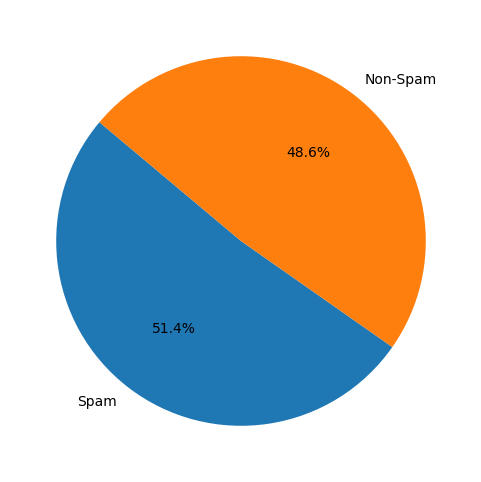

In [12]:
import matplotlib.pyplot as plt

# Sample data representing binary class distribution
class_labels = ['Spam', 'Non-Spam']
class_counts = [1005, 951]  # Number of instances for each class

# Create a pie plot
plt.figure(figsize=(6, 6))
plt.pie(class_counts, labels=class_labels, autopct='%1.1f%%', startangle=140)

plt.show()

## Dataset Distribution for target

<Axes: xlabel='target', ylabel='count'>

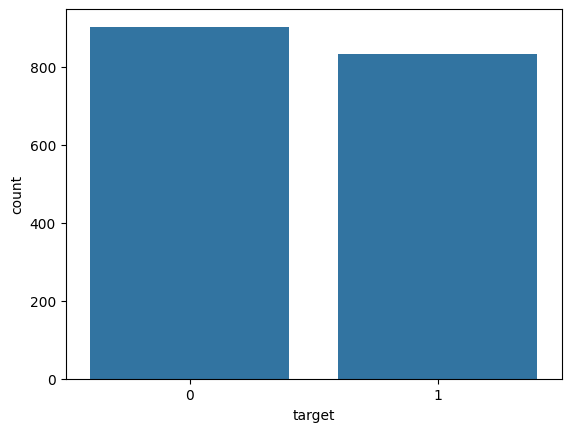

In [13]:
sns.countplot(x ='target', data = df)

## Length of each comment

In [14]:
df['comment_length'] = df["comment"].apply(lambda x: len(x.split(' ')))

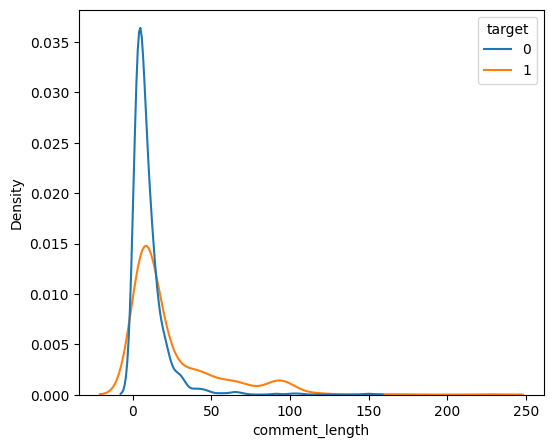

In [15]:
plt.figure(figsize=(6,5))


sns.kdeplot(x=df["comment_length"],hue=df["target"])
plt.show()


##  Average length of words in your text.t his can provide insights into the vocabulary’s complexity.

In [16]:
def average_word_length(text):
    words = text.split()
    total_length = sum(len(word) for word in words)
    num_words = len(words)
    if num_words != 0:
        avg_length = total_length / num_words
    else:
        avg_length = 0
        
    return avg_length

In [17]:
df["avg_length"]=df["comment"].apply(average_word_length)

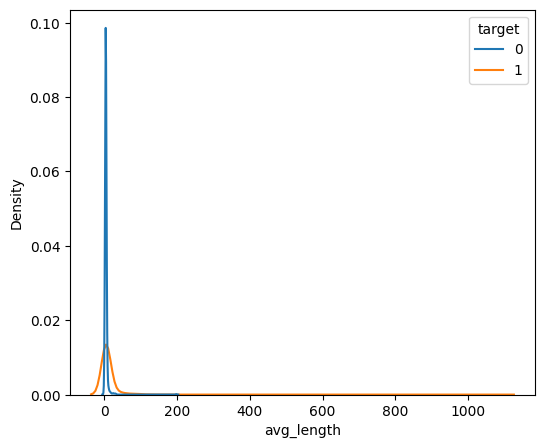

In [18]:

plt.figure(figsize=(6,5))



sns.kdeplot(x=df["avg_length"],hue=df["target"])
plt.show()


##  Clean the text

In [19]:
def cleaning(text):
  
	text = str(text).lower()
	text = emoji.demojize(text)
	
	text = re.sub('\[.*?\]', '', text)
	text = re.sub('https?://\S+|www\.\S+', '', text)
	text = re.sub('<.*?>+', '', text)
	
	text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
	text = re.sub('\n', '', text)
	text = re.sub('\w*\d\w*', '', text)
	return text

## Removing markup elements (HTML, XML, XHTML, etc.)

In [21]:
def markup(text):
	soup = BeautifulSoup(text)
	return soup.get_text()


## Handling non-text data

In [22]:
def non_text(text):
	Text=text.encode("utf-8")
	return Text


## Handling apostrophes

In [24]:
Apostrophes_expansion = {
"'s" : " is",
"'re" : " are",
"'r" : " are","n't":"not"} 
def remove_apostropes(text):
	words=word_tokenize(text)
	processed__text = [Apostrophes_expansion[word] if word in Apostrophes_expansion else word for word in words]
	processed_text = " ".join(processed__text)
	return processed_text



## Nonstandard spellings

In [25]:
from textblob import TextBlob
def nonstandard_spell(text):
	output = TextBlob(text).correct()
	return output



## Split-joined words


In [26]:
def split_word(text):
	processed_text = " ".join(re.findall('[A-Z][^A-Z]*', text))
	processed_text


## Handling emojis

In [27]:


def convert_emoji_to_text(emoji_text):
	text_with_aliases = emoji.demojize(emoji_text)
	return text_with_aliases

## Remove the stopwords

In [28]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\USER1\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [29]:
stop_words = stopwords.words('english')
def sw_rem(text):
	text = ' '.join(word for word in text.split(' ') if word not in stop_words)
	return text


## Stemmization the words

In [30]:
stems = nltk.SnowballStemmer('english')

def stemming(text):
	text = ' '.join(stems.stem(word) for word in text.split())
	return text

## Make a pipeline for the cleaning the text

In [31]:
def pipeline(text):
	text = cleaning(text)


	text = TextBlob(text).correct()
	text = ' ' .join(word for word in text.split(' ') if word not in stop_words)
	
	text = ' '.join(stems.stem(word) for word in text.split(' '))
	return text



In [32]:
df["clean_comment"] = df["comment"].apply(pipeline)
df.sample(10)


,comment,target,comment_length,avg_length,clean_comment
949,Please subscribe to my channel!Thanks!,1,5,6.800000,pleas subscrib channelthank
736,"Stop,is a very TOP 1",0,5,3.200000,stop top
1674,Best World Cup Song,0,4,4.000000,best world cup song
1669,Thank you. Please give your email.,1,6,4.833333,thank pleas give email
1372,Love Song,0,2,4.000000,love song
1168,Check out this video on YouTube:Love this song...,1,41,4.925000,check video youtubelov song good never go bac...
1140,"my sister just received over 6,500 new #active...",1,20,4.850000,sister receiv new activ coutur view right thi...
904,good party,0,2,4.500000,good parti
68,This is the only video on youtube that get so ...,0,43,4.195122,video coutur get much view want see much view...
1255,yo I know nobody will probably even read this....,1,98,4.358696,know nobodi probabl even read emma type way h...


In [38]:
df.sample(10)

,comment,target,comment_length,avg_length,clean_comment
1396,I can&#39;t believe this I just now watched a...,1,38,4.911765,believ watch brand new adult video clip hann...
1885,Northland Paranormal Society is now on YouTube...,1,19,6.473684,northward paranorm societi coutur check channe...
737,Ahhh back when my life didn&#39;t suck...,0,7,5.000000,ah back life suck
1684,I liked,0,2,3.000000,like
1268,this song is NICE,0,4,3.500000,song nice
80,http://woobox.com/33gxrf/brt0u5 FREE CS GO!!!!,1,4,10.750000,free go
886,Its 2015 and still shuffling to this song,0,8,4.250000,still shuffl song
447,Great video by a great artist in Katy Perry! A...,1,38,4.527778,great video great artist kate perri admir crea...
254,How did THIS Video in all of YouTube get this ...,0,46,4.309524,video coutur get mani view like langham style...
1906,"Subscribe me, I will? subscribe you back!!!",1,7,5.285714,subscrib subscrib back


## Most common Spam words



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



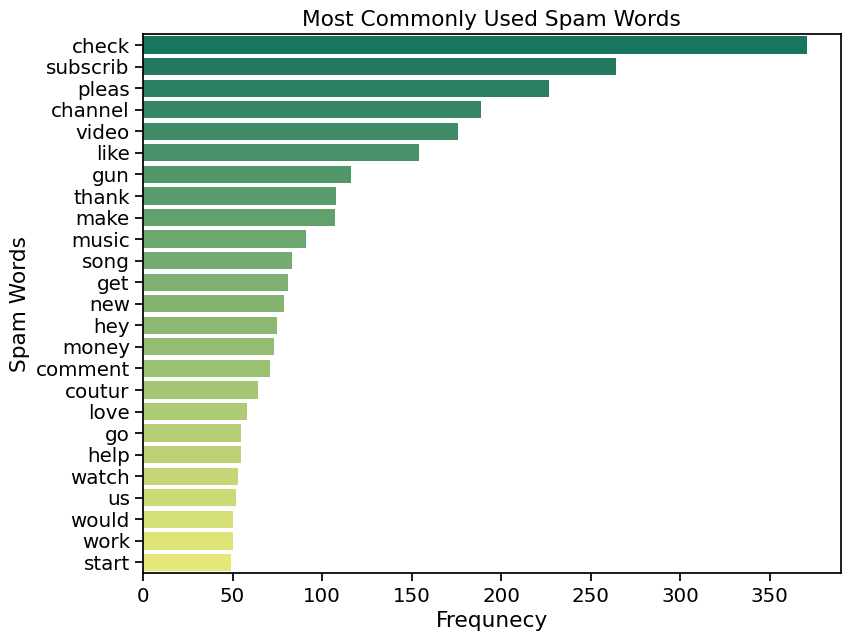

In [39]:
all_spam_words = []
for sentence in df[df['target'] == 1]['clean_comment'].to_list():
    for word in sentence.split():
        all_spam_words.append(word)

df16 = pd.DataFrame(Counter(all_spam_words).most_common(25), columns= ['Word', 'Frequency'])

sns.set_context('notebook', font_scale= 1.3)
plt.figure(figsize=(9,7))
sns.barplot(y = df16['Word'], x= df16['Frequency'], palette= 'summer')
plt.title("Most Commonly Used Spam Words")
plt.xlabel("Frequnecy")
plt.ylabel("Spam Words")
plt.show()

## Most common NON-Spam words



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



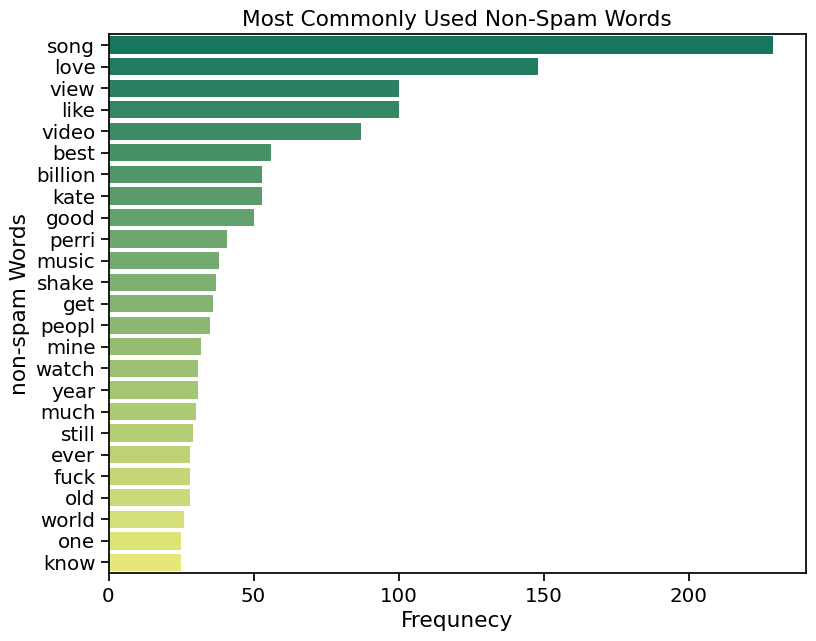

In [40]:
all_ham_words = []
for sentence in df[df['target'] == 0]['clean_comment'].to_list():
    for word in sentence.split():
        all_ham_words.append(word)

df17 = pd.DataFrame(Counter(all_ham_words).most_common(25), columns= ['Word', 'Frequency'])

sns.set_context('notebook', font_scale= 1.3)
plt.figure(figsize=(9,7))
sns.barplot(y = df17['Word'], x= df17['Frequency'], palette= 'summer')
plt.title("Most Commonly Used Non-Spam Words")
plt.xlabel("Frequnecy")
plt.ylabel("non-spam Words")
plt.show()

# wordcloud for corpus

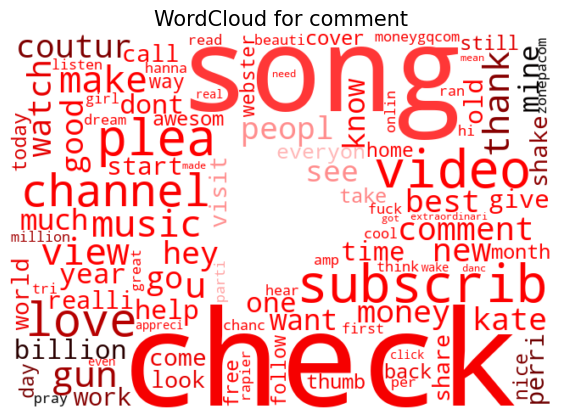

In [41]:
comment_corpus = " ".join(df['clean_comment'])
	

	

	
youtube_mask = np.array(Image.open("Youtube_logo.png"))
plt.figure(figsize=(7, 7))
 
wc = WordCloud(background_color='white',
				   max_words=100,
				   width=800, mode="RGBA",
				   height=400,mask=youtube_mask,
				   collocations=False).generate(comment_corpus)
image_colors = ImageColorGenerator(youtube_mask)
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
	
plt.title(f'WordCloud for comment', fontsize=15)
plt.axis('off')
plt.show()
 
 

In [42]:
def plot_word_cloud(df, typ):
	youtube_corpus = " ".join(df['clean_comment'])
	
	youtube_mask = np.array(Image.open("Youtube_logo.png"))

	

   
	plt.figure(figsize=(7, 7))
 
	wc = WordCloud(background_color='white',
				   max_words=100,
				   width=800, mode="RGBA",
				   height=400,mask=youtube_mask,
				   collocations=False).generate(youtube_corpus)
	image_colors = ImageColorGenerator(youtube_mask)
	plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
	
	plt.title(f'WordCloud for {typ} comment', fontsize=15)
	plt.axis('off')
	plt.show()
 


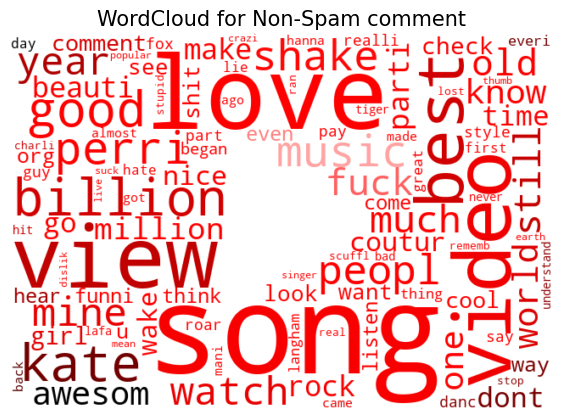

In [43]:
plot_word_cloud(df[df['target'] == 0], typ='Non-Spam')


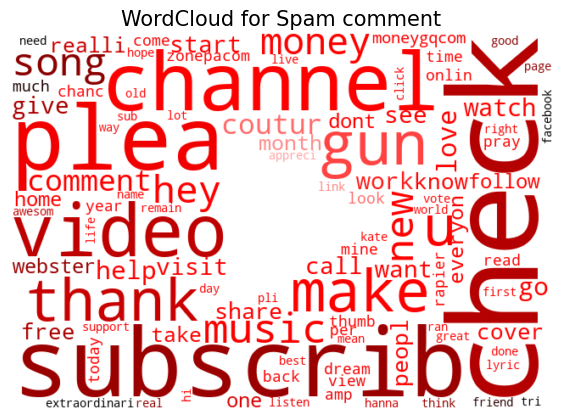

In [44]:
plot_word_cloud(df[df['target'] == 1], typ='Spam')

In [45]:
x = df["clean_comment"]
y = df['target']

len(x), len(y)

(1735, 1735)





## Split the data for training

In [46]:
X_train, X_test, y_train, y_test = train_test_split(x, y,test_size=0.2,random_state=1)






## Applying the bag of word for word emmbedding



In [47]:
from sklearn.feature_extraction.text import CountVectorizer
count = CountVectorizer(stop_words="english",ngram_range=(1, 1))
X_train_bag_of_words = count.fit_transform(X_train)
X_test_bag_of_words = count.transform(X_test)


In [48]:
X_train_bag_of_words.shape

(1388, 2127)

## Apply the tfidfvectorizer for word Emmbedding

In [49]:
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer()
X_train_tfidf = tfidf.fit_transform(X_train)
X_test_tfidf = tfidf.transform(X_test)

In [50]:
X_test_tfidf.shape

(347, 2207)

## Apply countvector bag of words

In [51]:
count = CountVectorizer(stop_words="english",ngram_range=(1, 3))
X_train_ba_of_words = count.fit_transform(X_train)
X_test_ba_of_words = count.transform(X_test)

In [52]:
from sklearn.naive_bayes import MultinomialNB

In [53]:
#we first create a dictionary of the required models.

def fit_models(X_train, X_test, y_train, y_test):

	# Making a list of ML Classifiers 

	classifiers = {'Logistic Regression Classifier':LogisticRegressionCV(max_iter=3000),
			   'KNN Classifier':KNeighborsClassifier(),
			   'Decision Tree Classifier':DecisionTreeClassifier(),
			   'Random Forest Classifier':RandomForestClassifier(),
			   'Support Vector Machine':SVC(C=100,kernel="rbf",gamma=1),
			   'Gradient Boosting Classifier':GradientBoostingClassifier(),
			   'xgboost Classifier':XGBClassifier(),
			   
			   'Bayes Classifier': GaussianNB()}
	
	# Making a list to store the model accurary rate scores
	Model_acc_score = [] 

	# Making a list to store model precision val
	model_precision_val = []

	# Making a list to store model recall
	model_recall_val = []

	# Making a list to store F1 score
	model_F1_score = []
		 
	# Making a index for containing the model names 
	index1 = []

	# Making a list to store time taken 
	time_taken = []

	# Using for loop to implement different machine learning models 
	for i in classifiers:

		begin = time.time()
		model = classifiers[i]
		model.fit(X_train,y_train)
		y_pred = model.predict(X_test)
		end = time.time()
		index1.append(i)
		Model_acc_score.append(accuracy_score(y_test,y_pred))
		model_precision_val.append(precision_score(y_test,y_pred))
		model_recall_val.append(recall_score(y_test,y_pred))
		model_F1_score.append(f1_score(y_test,y_pred))
		time_taken.append(end-begin)
	
	# Creating a Data Frame to contain the calculated valued for model accuracy, precision, recall and f1 score.
	table = pd.DataFrame(data = np.array([Model_acc_score,model_precision_val,model_recall_val,model_F1_score,time_taken]).T,
						 columns = ['Accuracy Score','Precision','Recall','F1','Time Taken'],index=index1)
	table.index.name = 'Models'
	table_sorted = table.sort_values(by='Accuracy Score', ascending=False)
	print(f'Total time taken is {sum(time_taken)}')
	return table_sorted

In [54]:
model_bagof_words=fit_models(X_train_bag_of_words.toarray(), X_test_bag_of_words.toarray(), y_train, y_test)

Total time taken is 8.011912107467651


In [55]:
model_bagof_words

,Accuracy Score,Precision,Recall,F1,Time Taken
Models,,,,,
xgboost Classifier,0.887608,0.945946,0.818713,0.877743,0.294462
Logistic Regression Classifier,0.876081,0.926667,0.812865,0.866044,2.303461
Random Forest Classifier,0.876081,0.840426,0.923977,0.880223,0.828003
Gradient Boosting Classifier,0.873199,0.970370,0.766082,0.856209,3.057005
Decision Tree Classifier,0.870317,0.831579,0.923977,0.875346,0.137619
Support Vector Machine,0.821326,0.763285,0.923977,0.835979,1.284527
KNN Classifier,0.760807,0.739130,0.795322,0.766197,0.036835
Bayes Classifier,0.714697,0.790323,0.573099,0.664407,0.070000


In [56]:
model_bgof_words=fit_models(X_train_ba_of_words.toarray(), X_test_ba_of_words.toarray(), y_train, y_test)


Total time taken is 296.93478894233704


In [57]:
model_bgof_words

,Accuracy Score,Precision,Recall,F1,Time Taken
Models,,,,,
xgboost Classifier,0.893372,0.946667,0.830409,0.884735,3.826004
Logistic Regression Classifier,0.890490,0.971631,0.801170,0.878205,45.975281
Gradient Boosting Classifier,0.873199,0.950355,0.783626,0.858974,56.950837
Random Forest Classifier,0.861671,0.825397,0.912281,0.866667,6.180027
Decision Tree Classifier,0.853026,0.803030,0.929825,0.861789,1.618002
Bayes Classifier,0.806916,0.833333,0.760234,0.795107,0.509157
KNN Classifier,0.682997,0.666667,0.713450,0.689266,0.320000
Support Vector Machine,0.616715,0.706522,0.380117,0.494297,181.555481


In [58]:
model_tfidf=fit_models(X_train_tfidf.toarray(), X_test_tfidf.toarray(), y_train, y_test)


Total time taken is 16.033082723617554


In [59]:
model_tfidf

,Accuracy Score,Precision,Recall,F1,Time Taken
Models,,,,,
Support Vector Machine,0.916427,0.927711,0.900585,0.913947,2.283002
Logistic Regression Classifier,0.902017,0.891429,0.912281,0.901734,5.902130
xgboost Classifier,0.887608,0.958333,0.807018,0.876190,0.738001
Random Forest Classifier,0.881844,0.845745,0.929825,0.885794,1.273001
Gradient Boosting Classifier,0.878963,0.970803,0.777778,0.863636,5.239041
Decision Tree Classifier,0.858790,0.805000,0.941520,0.867925,0.279000
KNN Classifier,0.729107,0.658436,0.935673,0.772947,0.242908
Bayes Classifier,0.714697,0.781250,0.584795,0.668896,0.076000


In [60]:
# function which plots accuracy scores, F1 score, along with time taken to fit for the models.
def search_plots(df,emmbedd):
	plt.figure(figsize=(5,5))
	ax = sns.barplot(data=df,y = df.index,x = 'Accuracy Score',hue=df.index)
	for container in ax.containers:
		ax.bar_label(container)
	plt.title(f'Accuracy Score for Different Models with {emmbedd}')
	plt.xticks(rotation=45)
	plt.show()

	plt.figure(figsize=(5,5))
	ax = sns.barplot(data=df,y = df.index,x = 'F1',hue=df.index,order= df['F1'].sort_values(ascending=False).index)
	for container in ax.containers:
		ax.bar_label(container)
	plt.title(f'F1 Score for Different Models {emmbedd}')
	plt.xticks(rotation=45)
	plt.show()

	plt.figure(figsize=(5,5))
	ax = sns.barplot(data=df,y = df.index,x = 'Time Taken',hue=df.index,order= df['Time Taken'].sort_values(ascending=False).index)
	for container in ax.containers:
		ax.bar_label(container)
	plt.title(f'Model Fitting Time for Different Models with {emmbedd}')
	plt.xticks(rotation=45)
	plt.show()

	

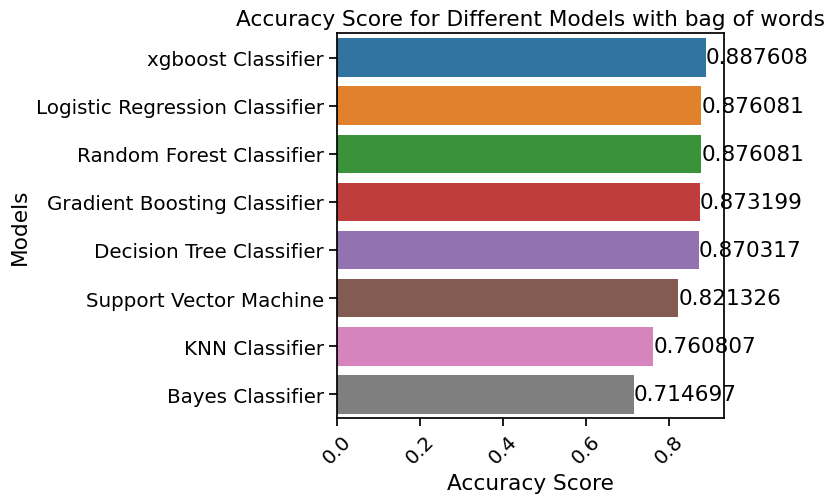

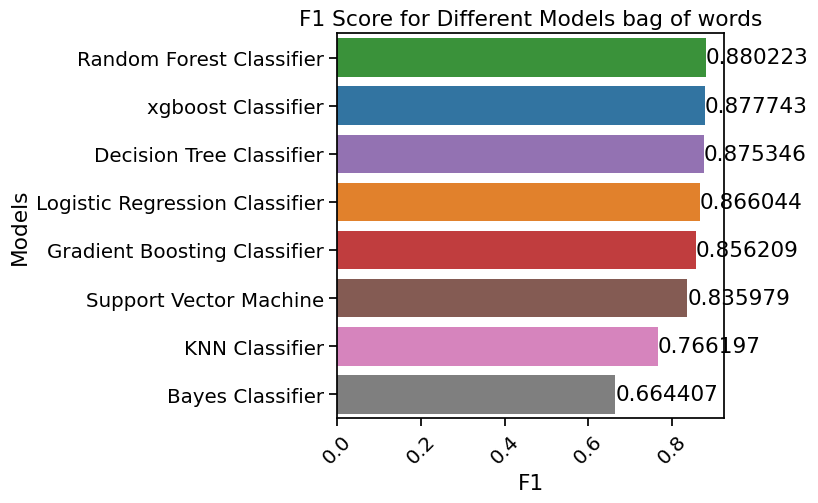

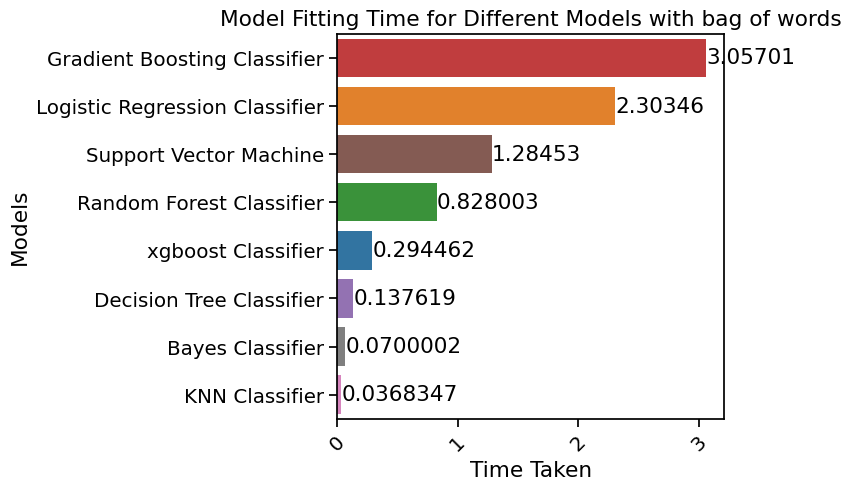

In [61]:
search_plots(model_bagof_words,emmbedd="bag of words")

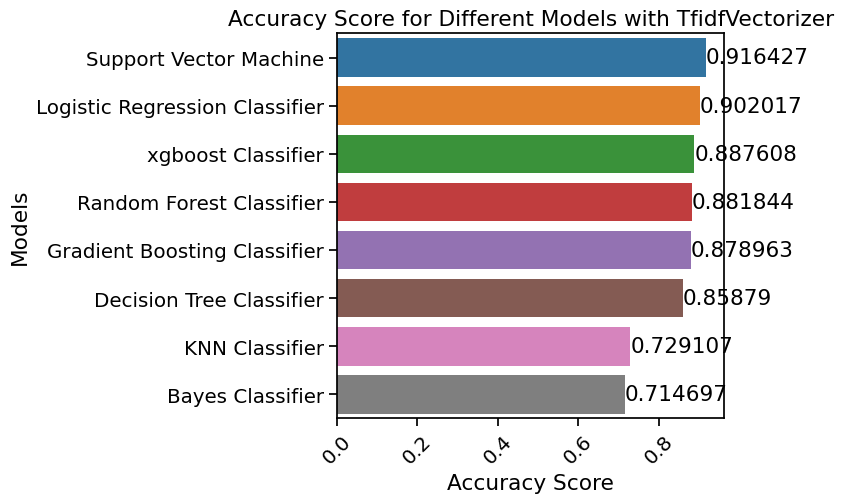

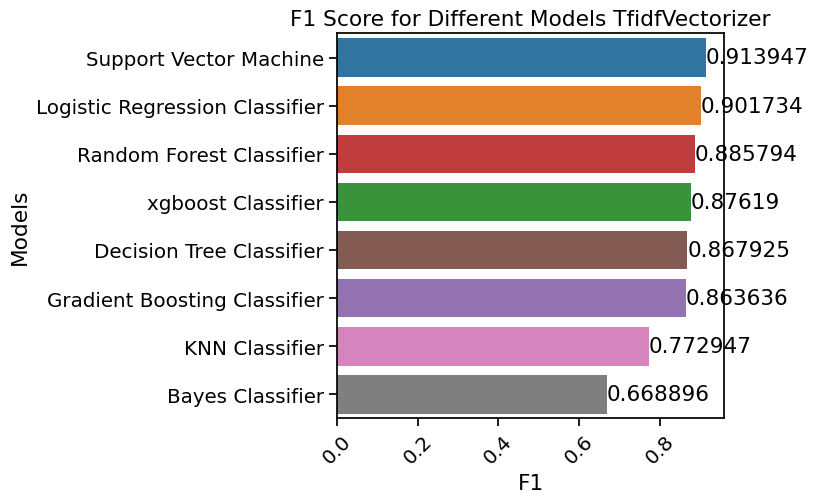

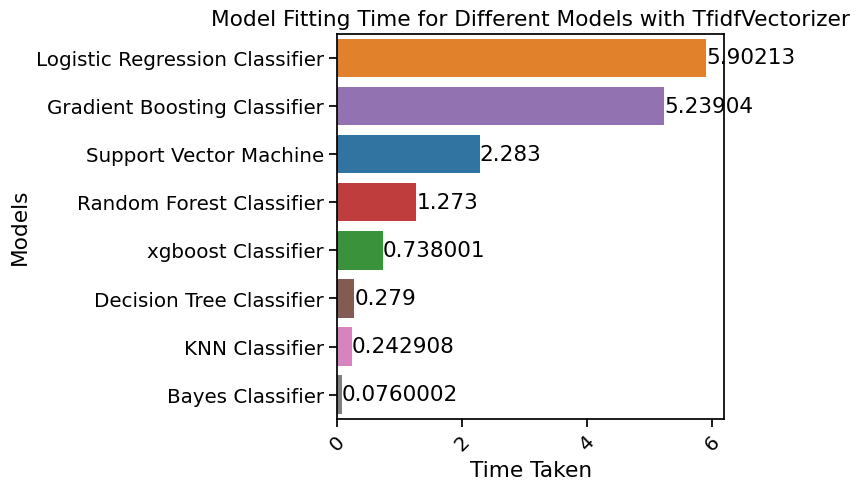

In [62]:
search_plots(model_tfidf,emmbedd="TfidfVectorizer")

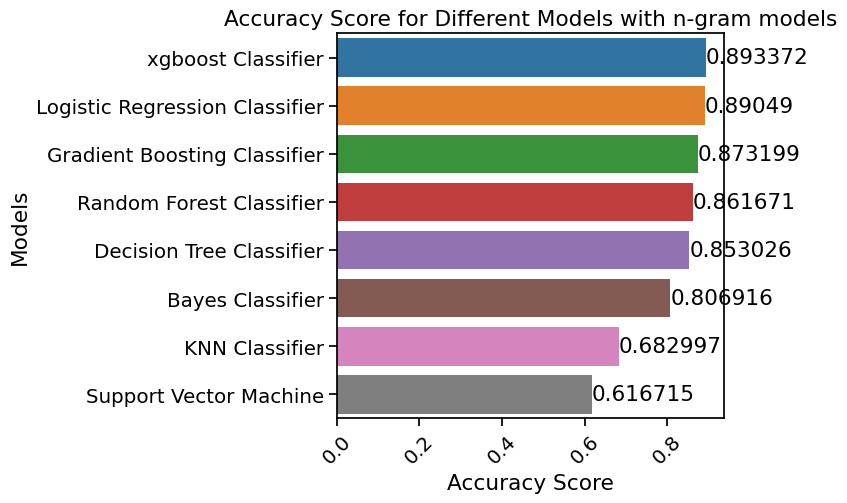

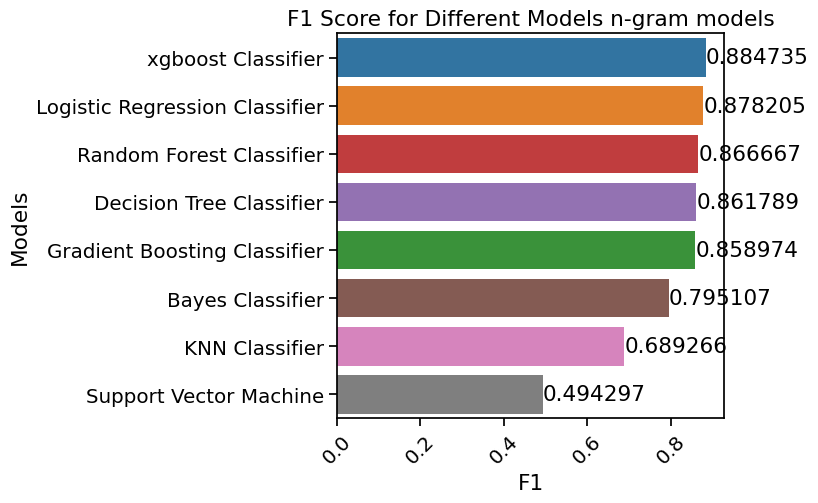

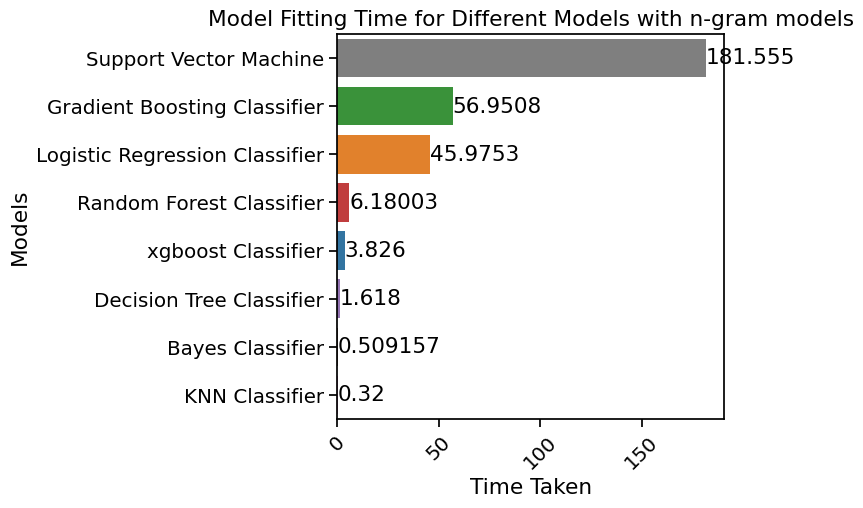

In [63]:
search_plots(model_bgof_words,emmbedd="n-gram models")



## ROC-AUC curve for different ML model

In [64]:
def roc_plot(X_train,X_test,y_test,y_train):
	models = {'Logistic Regression Classifier':LogisticRegressionCV(max_iter=1500),
			   'KNN Classifier':KNeighborsClassifier(),
			   'Decision Tree Classifier':DecisionTreeClassifier(),
			   'Random Forest Classifier':RandomForestClassifier(),
			   'Support Vector Machine':SVC(probability=True),
			   'Gradient Boosting Classifier':GradientBoostingClassifier(),
			   'xgboost Classifier':XGBClassifier(),
			   
			   'Bayes Classifier': MultinomialNB()}
	lst=[]
	lst1=[]
	na=[]
	ro=[]
	color=["b","g","r","c","m",'y','k',"w"]
	for name, model in models.items():
		
		model.fit(X_train, y_train)
		y_pred_prob = model.predict_proba(X_test)[:, 1]
		fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
		roc_auc = auc(fpr, tpr)
		lst.append(fpr)
		lst1.append(tpr)
		na.append(name)
		ro.append(roc_auc)

	for i in range(8):
		plt.plot(lst[i],lst1[i],label=na[i]+" "+str(ro[i].round(2)),color=color[i])

	plt.plot([0, 1], [0, 1], linestyle='--', color='grey', label='Random Guessing')

	plt.xlabel('False Positive Rate')
	plt.ylabel('True Positive Rate')
	plt.title('ROC Curve for Different ML Models')
	plt.legend()

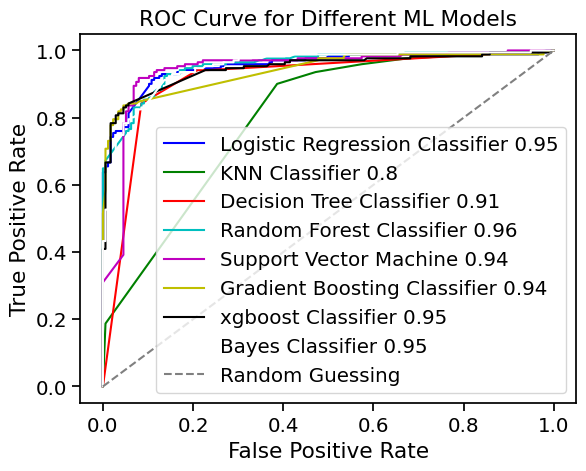

In [65]:
roc_plot(X_train_tfidf,X_test_tfidf,y_test,y_train)

## Fuction for evaluation of model

In [66]:
def evaluate_model(model, X, y):
	
	y_preds = np.round(model.predict(X))
	accuracy = accuracy_score(y, y_preds)
	precision = precision_score(y, y_preds)
	recall = recall_score(y, y_preds)
	f1 = f1_score(y, y_preds)
	
	model_results_dict = {'accuracy':accuracy,
						 'precision':precision,
						 'recall':recall,
						 'f1-score':f1}
						 
	confusion=confusion_matrix(y_test,y_preds)
	data=pd.DataFrame(confusion)
	sns.heatmap(data=data,annot=True,fmt="d")
	
	return model_results_dict

## # SVC classifier

In [193]:
sv=SVC()
sv.fit(X_train_tfidf,y_train)

SVC()

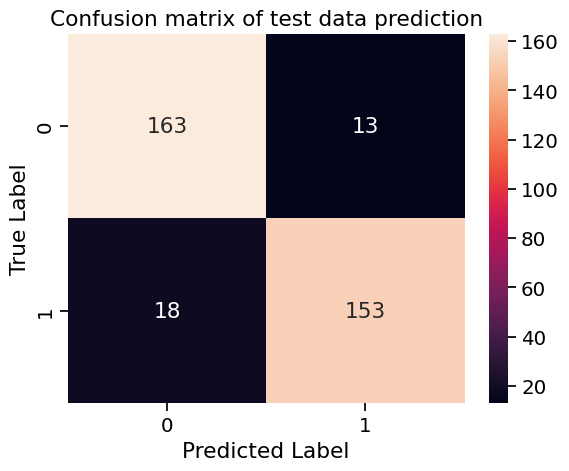

In [194]:
b=evaluate_model(sv, X_test_tfidf, y_test)
b
plt.title('Confusion matrix of test data prediction')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [195]:
b

{'accuracy': 0.9106628242074928,
 'precision': 0.9216867469879518,
 'recall': 0.8947368421052632,
 'f1-score': 0.9080118694362017}

In [196]:
yp=sv.predict(X_test_tfidf)

In [197]:


accuracy = accuracy_score(y_test, yp)
report = classification_report(y_test, yp)
acc = f"Accuracy is : {accuracy:.2f}"

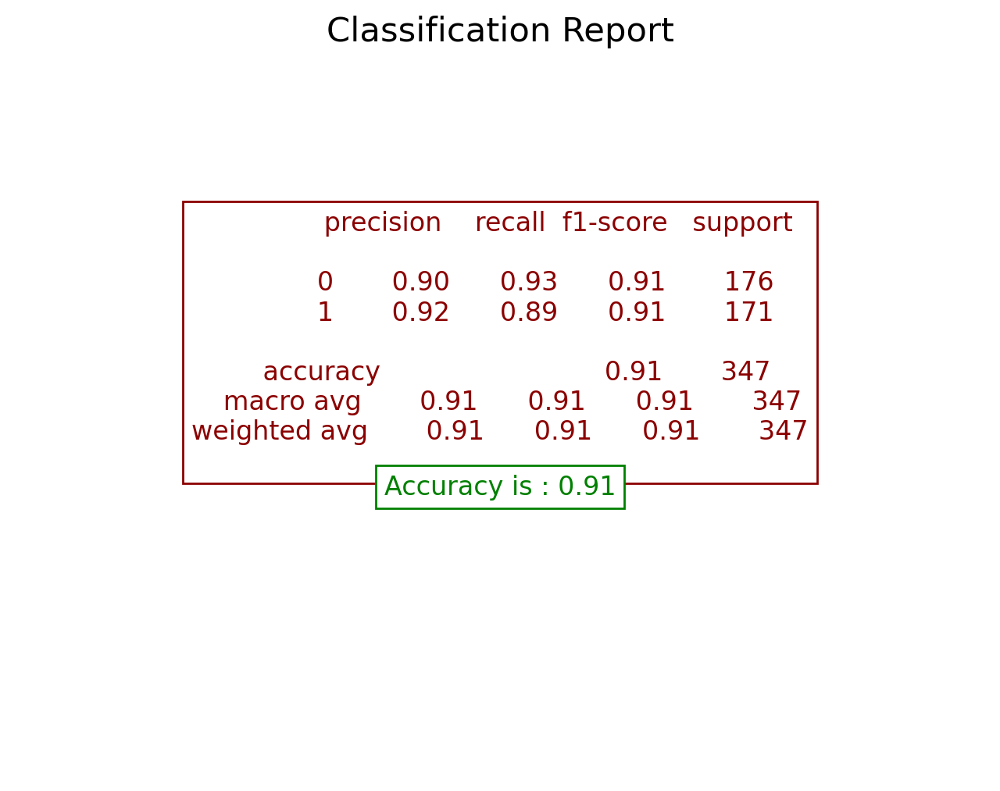

In [201]:
plt.figure(figsize=(8, 6), dpi=200)
plt.text(0.5, 0.6, report, fontsize=12, color='darkred', ha='center', va='center', bbox=dict(facecolor='white', edgecolor='darkred'))
plt.text(0.5, 0.4, acc, fontsize=12, color='Green', ha='center', va='center', bbox=dict(facecolor='white', edgecolor='green'))
plt.title('Classification Report')
plt.axis('off')
plt.show()

In [72]:
print(classification_report(y_test,yp))


              precision    recall  f1-score   support

           0       0.90      0.93      0.91       176
           1       0.92      0.89      0.91       171

    accuracy                           0.91       347
   macro avg       0.91      0.91      0.91       347
weighted avg       0.91      0.91      0.91       347



## #XGB classifer

In [73]:
xb=XGBClassifier()
xb.fit(X_train_tfidf.toarray(),y_train)



XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

{'accuracy': 0.8876080691642652,
 'precision': 0.9583333333333334,
 'recall': 0.8070175438596491,
 'f1-score': 0.8761904761904762}

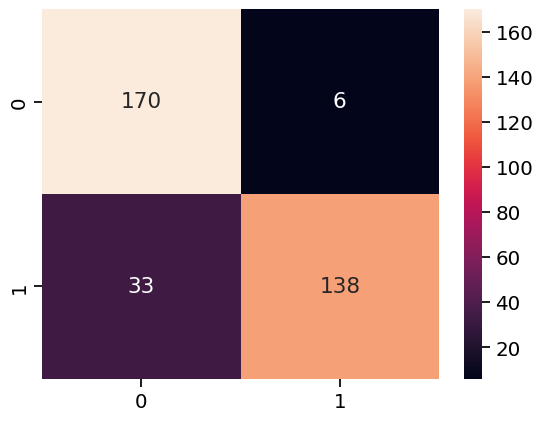

In [74]:
a=evaluate_model(xb, X_test_tfidf.toarray(), y_test)
a

## Randomforest classifier

In [87]:
rt=RandomForestClassifier()
rt.fit(X_train_tfidf,y_train)



RandomForestClassifier()

{'accuracy': 0.8933717579250721,
 'precision': 0.8563829787234043,
 'recall': 0.9415204678362573,
 'f1-score': 0.8969359331476323}

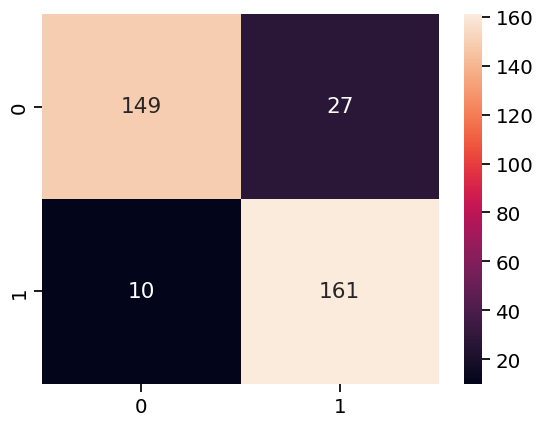

In [88]:
b=evaluate_model(rt, X_test_tfidf, y_test)
b

In [89]:
yp=rt.predict(X_test_tfidf)

In [90]:
accuracy = accuracy_score(y_test, yp)
report = classification_report(y_test, yp)
acc = f"Accuracy is : {accuracy:.2f}"

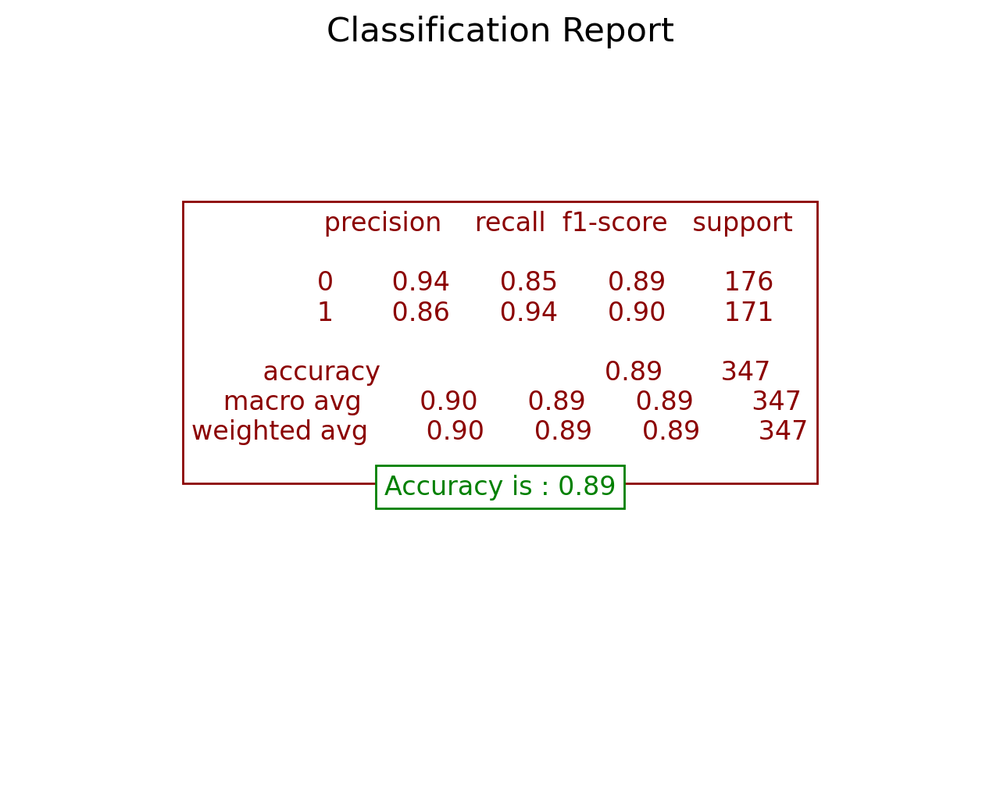

In [91]:
plt.figure(figsize=(8, 6), dpi=200)
plt.text(0.5, 0.6, report, fontsize=12, color='darkred', ha='center', va='center', bbox=dict(facecolor='white', edgecolor='darkred'))
plt.text(0.5, 0.4, acc, fontsize=12, color='Green', ha='center', va='center', bbox=dict(facecolor='white', edgecolor='green'))
plt.title('Classification Report')
plt.axis('off')
plt.show()

## logistic regression

In [95]:

lg=LogisticRegressionCV(max_iter=1500)
lg.fit(X_train_tfidf,y_train)

LogisticRegressionCV(max_iter=1500)

{'accuracy': 0.9020172910662824,
 'precision': 0.8914285714285715,
 'recall': 0.9122807017543859,
 'f1-score': 0.9017341040462428}

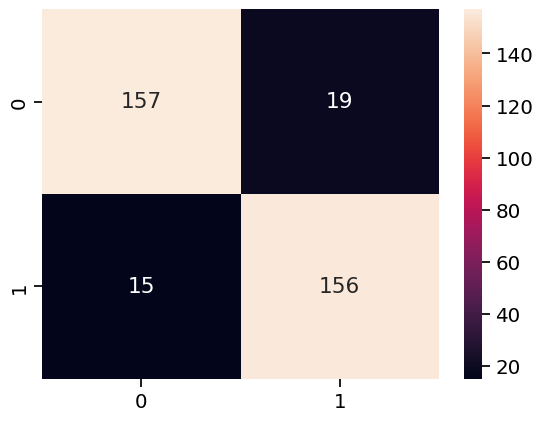

In [96]:



b=evaluate_model(lg, X_test_tfidf, y_test)
b

## #dataframe for all the model

In [97]:
total_results = pd.DataFrame({'logistic':a,
							 'supoort vector':b,
							 'xg':a,
							 }).transpose()

total_results

,accuracy,precision,recall,f1-score
logistic,0.887608,0.958333,0.807018,0.876190
supoort vector,0.902017,0.891429,0.912281,0.901734
xg,0.887608,0.958333,0.807018,0.876190


In [98]:
def train_model(model, data, targets):
    
    
    text_clf = Pipeline([('vect',TfidfVectorizer()),
                         ('clf', model)])
    
    text_clf.fit(data, targets)
    return text_clf

In [99]:
def get_F1(trained_model,X,y):
  
   
    predicted=trained_model.predict(X)
    
    f1=f1_score(y,predicted, average=None)
    
    return f1

In [100]:






RF =train_model(SVC(probability=True), X_train, y_train)

In [101]:
D2=X_test.reset_index()
D2

,index,clean_comment
0,1527,mine rock
1,268,
2,1437,guy anim planet lost girl began fox think ahahah
3,586,video great love thousand like much kate perri
4,404,may comment ...
...,...,...
342,1370,charli heroin
343,51,check back often help reach view avoid watch ...
344,260,hey think know deal theori could gotten hit ...
345,652,see ha


In [102]:
d3=y_test.reset_index()
d3

,index,target
0,1527,0
1,268,1
2,1437,0
3,586,0
4,404,1
...,...,...
342,1370,0
343,51,0
344,260,0
345,652,1


In [103]:
explainer_LR = LimeTextExplainer(class_names=RF.classes_)
idx=226
print("Actual Text : ", D2["clean_comment"][idx])
print("Prediction : ",RF.predict(D2["clean_comment"])[idx])
print("Actual :     ", d3["target"][idx])
exp = explainer_LR.explain_instance( D2["clean_comment"][idx], RF.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  subscrib channel pleas pro play
Prediction :  1
Actual :      1


In [104]:
explainer_LR = LimeTextExplainer(class_names=RF.classes_)
idx=344
print("Actual Text : ", D2["clean_comment"][idx])
print("Prediction : ",RF.predict(D2["clean_comment"])[idx])
print("Actual :     ", d3["target"][idx])
exp = explainer_LR.explain_instance( D2["clean_comment"][idx], RF.predict_proba,top_labels=5)
exp.show_in_notebook()

Actual Text :  hey think know deal theori  could gotten  hit  mabel made realli popular  stuck watch   peopl access internet includ coutur  number rise  half popul connect  hawker may love much rise   hit make popular   song featur danc game multipl   seen concert even new year eve event  see  mabel ad hit video  complain much neck  hit
Prediction :  0
Actual :      0



## #Find the word on which prediction depend

In [105]:


vectorizer = CountVectorizer()
X_vector = vectorizer.fit_transform(X_train)
X_vec=vectorizer.transform(X_test)
model = LogisticRegressionCV(max_iter=1500)
model.fit(X_vector, y_train)
explainer = lime.lime_tabular.LimeTabularExplainer(X_vector.toarray(), feature_names=vectorizer.get_feature_names_out(),
                                                   mode='classification',class_names=['0', '1'], discretize_continuous=True)
exp = explainer.explain_instance(X_vec.toarray()[0], model.predict_proba, num_features=10)
exp.show_in_notebook(show_table=True)

In [106]:

vectorizer = CountVectorizer()
X_vector = vectorizer.fit_transform(X_train)
X_vec=vectorizer.transform(X_test)
model = SVC(probability=True)
model.fit(X_vector, y_train)
explainer = lime.lime_tabular.LimeTabularExplainer(X_vector.toarray(), feature_names=vectorizer.get_feature_names_out(),
                                                   class_names=['0', '1'], discretize_continuous=True)
exp = explainer.explain_instance(X_vec.toarray()[0], model.predict_proba, num_features=10)
exp.show_in_notebook()

In [107]:

vectorizer = CountVectorizer()
X_vector = vectorizer.fit_transform(X_train)
X_vec=vectorizer.transform(X_test)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_vector, y_train)
explainer = lime.lime_tabular.LimeTabularExplainer(X_vector.toarray(), feature_names=vectorizer.get_feature_names_out(),
                                                   class_names=['0', '1'], discretize_continuous=True)
exp = explainer.explain_instance(X_vec.toarray()[0], model.predict_proba, num_features=10)
exp.show_in_notebook()

## #SHAP VAlue

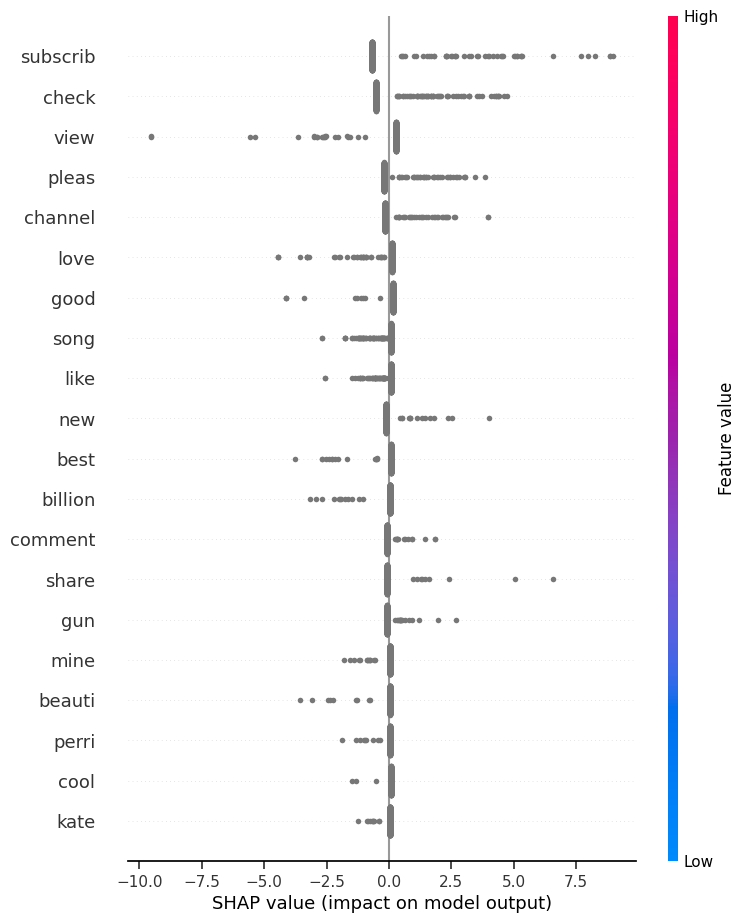

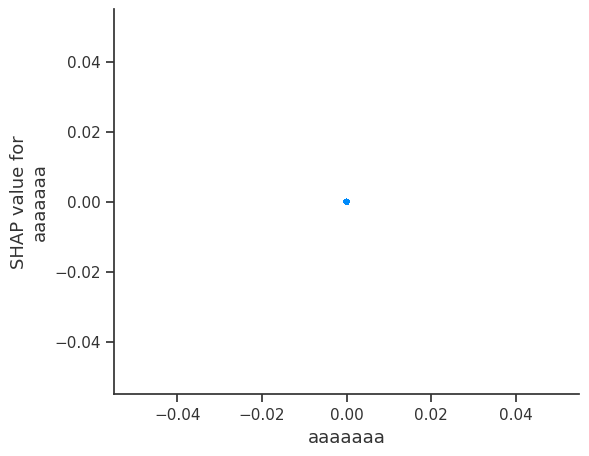

In [108]:
clf =LogisticRegressionCV(max_iter=1500)
clf.fit(X_train_tfidf, y_train)
explainer = shap.Explainer(clf, X_train_tfidf)
shap_values = explainer.shap_values(X_test_tfidf)
shap.summary_plot(shap_values, X_test_tfidf, feature_names=vectorizer.get_feature_names_out())
feature_idx = 0  
feature_name = vectorizer.get_feature_names_out()[feature_idx]
X_test_dense = X_test_tfidf.toarray()
shap.dependence_plot(feature_name, shap_values, X_test_dense, feature_names=vectorizer.get_feature_names_out())
plt.show()


##  Train our Word2vec  word embbedding

In [109]:
from gensim.models import Word2Vec

sentences = [sentence.split() for sentence in X_train]
w2v_model = Word2Vec(sentences,vector_size=200, window=3, min_count=1,workers=4,epochs=200,sg=1)

In [110]:
words = w2v_model.wv
words

##  Mean of document word emmbedding

In [111]:
def vectorize(sentence):
    words = sentence.split()
    words_vecs = [w2v_model.wv[word] for word in words if word in w2v_model.wv]
    if len(words_vecs) == 0:
        return np.zeros(200)
    words_vecs = np.array(words_vecs)
    return words_vecs.mean(axis=0)

X_train_w2vec = np.array([vectorize(sentence) for sentence in X_train])
X_test_w2vec = np.array([vectorize(sentence) for sentence in X_test])

In [112]:
model_w2v_of_words=fit_models(X_train_w2vec, X_test_w2vec, y_train, y_test)

Total time taken is 22.7542941570282


In [113]:
model_w2v_of_words

,Accuracy Score,Precision,Recall,F1,Time Taken
Models,,,,,
Random Forest Classifier,0.887608,0.875000,0.900585,0.887608,2.106100
xgboost Classifier,0.878963,0.841270,0.929825,0.883333,0.392998
Logistic Regression Classifier,0.873199,0.862857,0.883041,0.872832,3.854104
Gradient Boosting Classifier,0.867435,0.827225,0.923977,0.872928,15.887616
Decision Tree Classifier,0.841499,0.811828,0.883041,0.845938,0.344481
KNN Classifier,0.801153,0.731818,0.941520,0.823529,0.014995
Bayes Classifier,0.795389,0.731481,0.923977,0.816537,0.003000
Support Vector Machine,0.792507,0.861314,0.690058,0.766234,0.151000


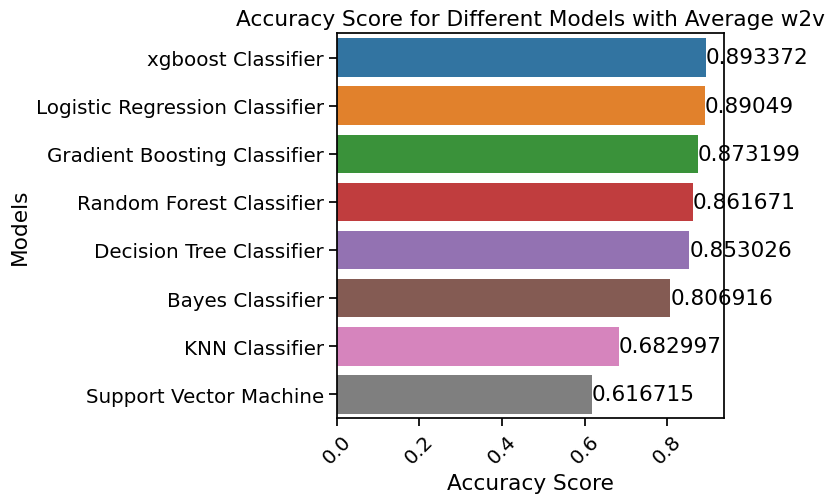

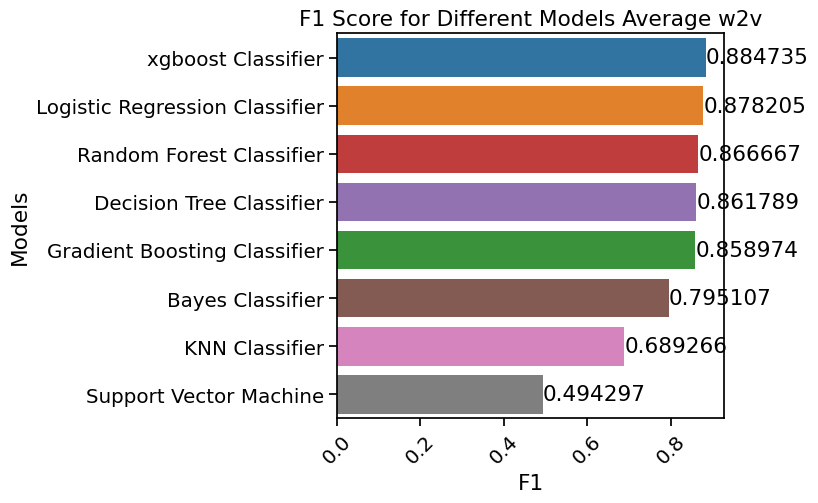

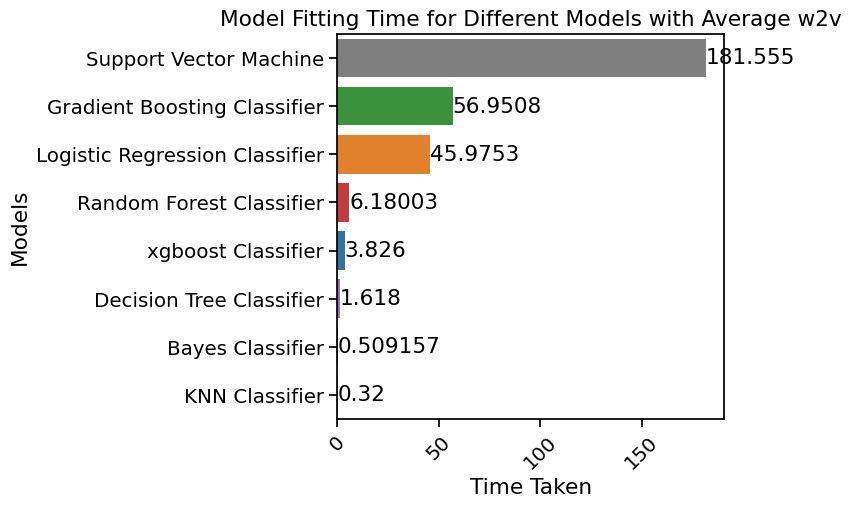

In [114]:
search_plots(model_bgof_words,emmbedd="Average w2v")

##  Tokenize the Text

In [115]:
tk = Tokenizer()
tk.fit_on_texts(X_train)

## Count the no of Vacobarary

In [116]:

vocab = len(tk.word_index)+1
vocab

2224

## Find the maximum length of comment

In [117]:
max_len = np.max(df["comment"].apply(lambda x: len(x.split())).values)
max_len

213

##  Make a sequence of vector


In [118]:
def embedding(x):
    return tk.texts_to_sequences(x)


##  Padding the text vector to lenth of 80

In [119]:
X_train_padded = pad_sequences(embedding(X_train), 80, padding='post')
X_test_padded= pad_sequences(embedding(X_test), 80, padding='post')

## Open the 200 dimension pretrained glove emmbedding

In [120]:
file = open('glove.6B.100d.txt', 'r', encoding = 'utf8')
content = file.readlines()
file.close()
len(content)

400000

In [121]:
word2index = tk.word_index

##  Create emmbedding dictionary of glove

In [122]:


embeddings = {}

for line in content:
    line = line.split()
    embeddings[line[0]] = np.array(line[1:], dtype = float)

## Pretrained word emmbedding of skipgram w2vec

In [123]:
import gensim
import gensim.downloader

for model_name in list(gensim.downloader.info()['models'].keys()):
  print(model_name)

fasttext-wiki-news-subwords-300
conceptnet-numberbatch-17-06-300
word2vec-ruscorpora-300
word2vec-google-news-300
glove-wiki-gigaword-50
glove-wiki-gigaword-100
glove-wiki-gigaword-200
glove-wiki-gigaword-300
glove-twitter-25
glove-twitter-50
glove-twitter-100
glove-twitter-200
__testing_word2vec-matrix-synopsis


In [124]:
import gensim
import gensim.downloader
 
pre_w2v = gensim.downloader.load('word2vec-google-news-300')

##  Fastext pretrained emmbedding

In [125]:

pretrained_fastext = gensim.downloader.load("fasttext-wiki-news-subwords-300")


##  Tokenize the X_train 

In [126]:
word_tokenizer = nltk.WordPunctTokenizer()
word_tokens = [word_tokenizer.tokenize(sent) for sent in X_train]

##  Trained our  word2vec

In [127]:
from gensim.models import Word2Vec
w2v_model2 = Word2Vec(word_tokens, vector_size=100, min_count=1,window=3,sg = 0,epochs=20 )

In [128]:
w2v_model2.save("word2vecskip")

In [129]:
w2v_model2 = Word2Vec.load("word2vecskip")


## Training our fastextmodel

In [130]:

from gensim.models.fasttext import FastText

In [131]:
fast_Text_model = FastText(word_tokens, window=3,vector_size=100, min_count=1,workers = 4, epochs=20,sg=1 )

In [132]:
from gensim.models import Word2Vec

fast_Text_model.save("fastextmodel.100")

fast_Text_modelfast_Text_model = Word2Vec.load("fastextmodel.100")

##  Make word emmbedding matrix

In [133]:
def emmbed_matrix(pretrained_emmbedd):
    embedding_matrix = np.zeros((len(word2index)+1,100))
    for word,i in word2index.items():
        try:
            embedding_value = pretrained_emmbedd.wv[word]
            if embedding_value is not None:
                embedding_matrix[i] = embedding_value         
        except KeyError:
            embedding_matrix[i]=np.random.normal(0,np.sqrt(0.25),100) 
    return embedding_matrix




## Make a emmbedded Matrix for fasttext

In [134]:
emmbedded_matrix_traind_fasttext=emmbed_matrix(fast_Text_model)

## Make a emmbedded Matrix for w2vec

In [135]:
emmbedded_matrix_traind_w2vec=emmbed_matrix(w2v_model2)

## Make a emmbedded Matrix for pretrained fasttext

In [136]:


def pre_trained_emmbeed(emmbedd):
    
    embedding_matrix = np.zeros((len(word2index)+1,300))
    for word,i in word2index.items():
        try:
            embedding_value = emmbedd[word]
            if embedding_value is not None:
                embedding_matrix[i] = embedding_value         
        except KeyError:
            embedding_matrix[i]=np.random.normal(0,np.sqrt(0.25),300) 
    return embedding_matrix

In [137]:
emmbedded_matrix_pre_traind_fast=pre_trained_emmbeed(pretrained_fastext)


## Make a emmbedded Matrix for pretrained w2vec

In [138]:
emmbedded_matrix_pre_traind_w2vec=pre_trained_emmbeed(pre_w2v)

## Make a emmbedded Matrix for pretrained glove

In [139]:
embed_size = 200
embedding_matrix_glove = np.zeros((len(word2index)+1, embed_size))

for word, i in word2index.items():
    try:
        embedding_value = embeddings.get(word)
        if embedding_value is not None:
            embedding_matrix_glove[i] = embedding_value         
    except KeyError:
            embedding_matrix_glove[i]=np.random.normal(0,np.sqrt(0.25),200) 
    

## Number of rows with empty words assigned to array of size 200 with values 0.25

In [140]:
count = 0
for i in range(len(emmbedded_matrix_pre_traind_w2vec)):
    if np.array_equal(emmbedded_matrix_pre_traind_w2vec[i],np.zeros(100) +0):
        count +=1
print(count)

0


##  Bidirectional LSTM with pretrained Glove Emmbedded Vector

In [141]:
model = Sequential()
model.add(Embedding(
                   input_dim=embedding_matrix_glove.shape[0], 
                   output_dim=embedding_matrix_glove.shape[1],
                   weights=[embedding_matrix_glove],trainable=False,
                   input_length=80)
         )
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(GlobalMaxPool1D())
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 80, 200)           444800    
                                                                 
 bidirectional (Bidirection  (None, 80, 200)           240800    
 al)                                                             
                                                                 
 bidirectional_1 (Bidirecti  (None, 80, 200)           240800    
 onal)                                                           
                                                                 
 bidirectional_2 (Bidirecti  (None, 80, 200)           240800    
 onal)                                                           
                                                                 
 global_max_pooling1d (Glob  (None, 200)               0         
 alMaxPooling1D)                                       

In [142]:
checkpoints = ModelCheckpoint('ck_model.h5', monitor='val_loss', verbose=1, save_best_only=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', vactor=0.1, verbose=1, patience=5, min_lr=0.0001)

In [143]:
history = model.fit(X_train_padded, y_train, epochs=10, batch_size=32, validation_data=(X_test_padded, y_test), verbose=1, callbacks=[reduce_lr, checkpoints])

Epoch 1/10


44/44 [==============================] - ETA: 0s - loss: 0.4966 - accuracy: 0.7695
Epoch 1: val_loss improved from inf to 0.61253, saving model to ck_model.h5
44/44 [==============================] - 37s 500ms/step - loss: 0.4966 - accuracy: 0.7695 - val_loss: 0.6125 - val_accuracy: 0.8127 - lr: 0.0010
Epoch 2/10


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


44/44 [==============================] - ETA: 0s - loss: 0.3532 - accuracy: 0.8372
Epoch 2: val_loss improved from 0.61253 to 0.50886, saving model to ck_model.h5
44/44 [==============================] - 20s 459ms/step - loss: 0.3532 - accuracy: 0.8372 - val_loss: 0.5089 - val_accuracy: 0.8127 - lr: 0.0010
Epoch 3/10
44/44 [==============================] - ETA: 0s - loss: 0.3052 - accuracy: 0.8595
Epoch 3: val_loss improved from 0.50886 to 0.44773, saving model to ck_model.h5
44/44 [==============================] - 20s 457ms/step - loss: 0.3052 - accuracy: 0.8595 - val_loss: 0.4477 - val_accuracy: 0.8386 - lr: 0.0010
Epoch 4/10
44/44 [==============================] - ETA: 0s - loss: 0.2909 - accuracy: 0.8689
Epoch 4: val_loss improved from 0.44773 to 0.44620, saving model to ck_model.h5
44/44 [==============================] - 20s 461ms/step - loss: 0.2909 - accuracy: 0.8689 - val_loss: 0.4462 - val_accuracy: 0.8559 - lr: 0.0010
Epoch 5/10
44/44 [==============================] - ET

11/11 [==============================] - 3s 83ms/step


{'accuracy': 0.8213256484149856,
 'precision': 0.957983193277311,
 'recall': 0.6666666666666666,
 'f1-score': 0.786206896551724}

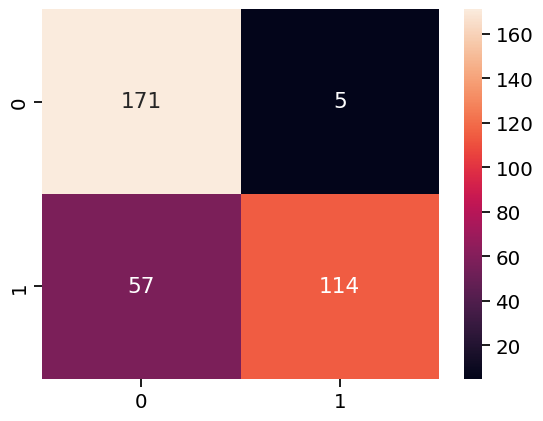

In [144]:
pretrained_GLove=evaluate_model(model, X_test_padded, y_test)
pretrained_GLove

##  Bidirectional LSTM with pretrained w2vec Emmbedded Vector

In [145]:
model = Sequential()
model.add(Embedding(
                   input_dim=emmbedded_matrix_pre_traind_w2vec.shape[0], 
                   output_dim=emmbedded_matrix_pre_traind_w2vec.shape[1],
                   weights=[emmbedded_matrix_pre_traind_w2vec],trainable=False,
                   input_length=80)
         )
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(GlobalMaxPool1D())
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 80, 300)           667200    
                                                                 
 bidirectional_3 (Bidirecti  (None, 80, 200)           320800    
 onal)                                                           
                                                                 
 bidirectional_4 (Bidirecti  (None, 80, 200)           240800    
 onal)                                                           
                                                                 
 bidirectional_5 (Bidirecti  (None, 80, 200)           240800    
 onal)                                                           
                                                                 
 global_max_pooling1d_1 (Gl  (None, 200)               0         
 obalMaxPooling1D)                                    

In [146]:
checkpoints = ModelCheckpoint('ck_model.h5', monitor='val_loss', verbose=1, save_best_only=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', vactor=0.1, verbose=1, patience=5, min_lr=0.0001)
history = model.fit(X_train_padded, y_train, epochs=10, batch_size=32, validation_data=(X_test_padded, y_test), verbose=1, callbacks=[reduce_lr, checkpoints])

Epoch 1/10
44/44 [==============================] - ETA: 0s - loss: 0.4272 - accuracy: 0.8048
Epoch 1: val_loss improved from inf to 0.57795, saving model to ck_model.h5
44/44 [==============================] - 38s 535ms/step - loss: 0.4272 - accuracy: 0.8048 - val_loss: 0.5780 - val_accuracy: 0.7723 - lr: 0.0010
Epoch 2/10


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


44/44 [==============================] - ETA: 0s - loss: 0.2854 - accuracy: 0.8818
Epoch 2: val_loss improved from 0.57795 to 0.50897, saving model to ck_model.h5
44/44 [==============================] - 22s 497ms/step - loss: 0.2854 - accuracy: 0.8818 - val_loss: 0.5090 - val_accuracy: 0.8473 - lr: 0.0010
Epoch 3/10
44/44 [==============================] - ETA: 0s - loss: 0.2193 - accuracy: 0.9128
Epoch 3: val_loss improved from 0.50897 to 0.49116, saving model to ck_model.h5
44/44 [==============================] - 22s 505ms/step - loss: 0.2193 - accuracy: 0.9128 - val_loss: 0.4912 - val_accuracy: 0.8444 - lr: 0.0010
Epoch 4/10
44/44 [==============================] - ETA: 0s - loss: 0.2005 - accuracy: 0.9193
Epoch 4: val_loss improved from 0.49116 to 0.43299, saving model to ck_model.h5
44/44 [==============================] - 23s 516ms/step - loss: 0.2005 - accuracy: 0.9193 - val_loss: 0.4330 - val_accuracy: 0.8329 - lr: 0.0010
Epoch 5/10
44/44 [==============================] - ET

11/11 [==============================] - 3s 94ms/step


{'accuracy': 0.8645533141210374,
 'precision': 0.9246575342465754,
 'recall': 0.7894736842105263,
 'f1-score': 0.8517350157728706}

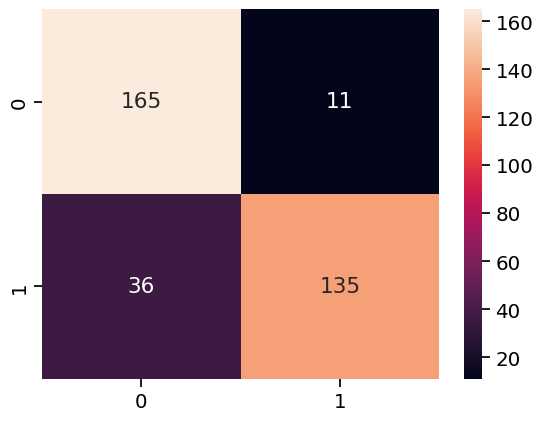

In [147]:
pretrained_word2vec=evaluate_model(model, X_test_padded, y_test)
pretrained_word2vec

##  Bidirectional LSTM with pretrained fasttext Emmbedded Vector

In [148]:
model = Sequential()
model.add(Embedding(
                   input_dim=emmbedded_matrix_pre_traind_fast.shape[0], 
                   output_dim=emmbedded_matrix_pre_traind_fast.shape[1],
                   weights=[emmbedded_matrix_pre_traind_fast],trainable=False,
                   input_length=80)
         )
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(GlobalMaxPool1D())
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 80, 300)           667200    
                                                                 
 bidirectional_6 (Bidirecti  (None, 80, 200)           320800    
 onal)                                                           
                                                                 
 bidirectional_7 (Bidirecti  (None, 80, 200)           240800    
 onal)                                                           
                                                                 
 bidirectional_8 (Bidirecti  (None, 80, 200)           240800    
 onal)                                                           
                                                                 
 global_max_pooling1d_2 (Gl  (None, 200)               0         
 obalMaxPooling1D)                                    

In [149]:
checkpoints = ModelCheckpoint('ck_model.h5', monitor='val_loss', verbose=1, save_best_only=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', vactor=0.1, verbose=1, patience=5, min_lr=0.0001)
history = model.fit(X_train_padded, y_train, epochs=10, batch_size=32, validation_data=(X_test_padded, y_test), verbose=1, callbacks=[reduce_lr, checkpoints])

Epoch 1/10
44/44 [==============================] - ETA: 0s - loss: 0.5559 - accuracy: 0.7176
Epoch 1: val_loss improved from inf to 0.65086, saving model to ck_model.h5
44/44 [==============================] - 38s 528ms/step - loss: 0.5559 - accuracy: 0.7176 - val_loss: 0.6509 - val_accuracy: 0.7637 - lr: 0.0010
Epoch 2/10


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


44/44 [==============================] - ETA: 0s - loss: 0.4232 - accuracy: 0.8213
Epoch 2: val_loss improved from 0.65086 to 0.62942, saving model to ck_model.h5
44/44 [==============================] - 22s 490ms/step - loss: 0.4232 - accuracy: 0.8213 - val_loss: 0.6294 - val_accuracy: 0.5360 - lr: 0.0010
Epoch 3/10
44/44 [==============================] - ETA: 0s - loss: 0.3228 - accuracy: 0.8718
Epoch 3: val_loss improved from 0.62942 to 0.54963, saving model to ck_model.h5
44/44 [==============================] - 23s 530ms/step - loss: 0.3228 - accuracy: 0.8718 - val_loss: 0.5496 - val_accuracy: 0.8069 - lr: 0.0010
Epoch 4/10
44/44 [==============================] - ETA: 0s - loss: 0.2892 - accuracy: 0.8919
Epoch 4: val_loss improved from 0.54963 to 0.54593, saving model to ck_model.h5
44/44 [==============================] - 23s 533ms/step - loss: 0.2892 - accuracy: 0.8919 - val_loss: 0.5459 - val_accuracy: 0.6772 - lr: 0.0010
Epoch 5/10
44/44 [==============================] - ET

11/11 [==============================] - 3s 97ms/step


{'accuracy': 0.7031700288184438,
 'precision': 0.6278195488721805,
 'recall': 0.9766081871345029,
 'f1-score': 0.7643020594965675}

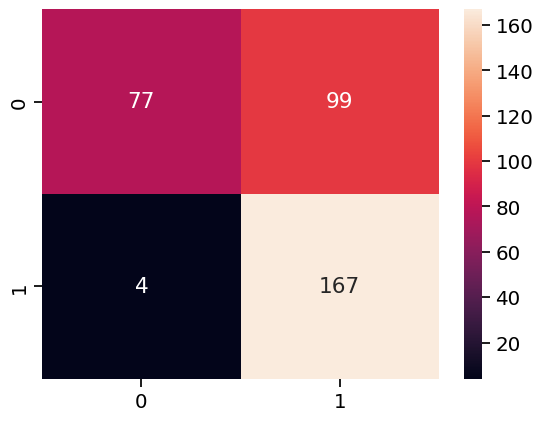

In [150]:
pretrained_fasttext=evaluate_model(model, X_test_padded, y_test)
pretrained_fasttext

##  Bidirectional LSTM with our trained w2vec Emmbedded Vector

In [151]:

model = Sequential()
model.add(Embedding(
                   input_dim=emmbedded_matrix_traind_w2vec.shape[0], 
                   output_dim=emmbedded_matrix_traind_w2vec.shape[1],
                   weights=[emmbedded_matrix_traind_w2vec],trainable=False,
                   input_length=80)
         )
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(GlobalMaxPool1D())
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 80, 100)           222400    
                                                                 
 bidirectional_9 (Bidirecti  (None, 80, 200)           160800    
 onal)                                                           
                                                                 
 bidirectional_10 (Bidirect  (None, 80, 200)           240800    
 ional)                                                          
                                                                 
 bidirectional_11 (Bidirect  (None, 80, 200)           240800    
 ional)                                                          
                                                                 
 global_max_pooling1d_3 (Gl  (None, 200)               0         
 obalMaxPooling1D)                                    

In [152]:


checkpoints = ModelCheckpoint('ck_model.h5', monitor='val_loss', verbose=1, save_best_only=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', vactor=0.1, verbose=1, patience=5, min_lr=0.0001)
history = model.fit(X_train_padded, y_train, epochs=10, batch_size=32, validation_data=(X_test_padded, y_test), verbose=1, callbacks=[reduce_lr, checkpoints])

Epoch 1/10
44/44 [==============================] - ETA: 0s - loss: 0.6265 - accuracy: 0.6376
Epoch 1: val_loss improved from inf to 0.65479, saving model to ck_model.h5
44/44 [==============================] - 36s 492ms/step - loss: 0.6265 - accuracy: 0.6376 - val_loss: 0.6548 - val_accuracy: 0.6628 - lr: 0.0010
Epoch 2/10


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


44/44 [==============================] - ETA: 0s - loss: 0.5118 - accuracy: 0.7579
Epoch 2: val_loss improved from 0.65479 to 0.59325, saving model to ck_model.h5
44/44 [==============================] - 19s 437ms/step - loss: 0.5118 - accuracy: 0.7579 - val_loss: 0.5932 - val_accuracy: 0.7637 - lr: 0.0010
Epoch 3/10
44/44 [==============================] - ETA: 0s - loss: 0.4288 - accuracy: 0.7997
Epoch 3: val_loss did not improve from 0.59325
44/44 [==============================] - 19s 437ms/step - loss: 0.4288 - accuracy: 0.7997 - val_loss: 0.6019 - val_accuracy: 0.6974 - lr: 0.0010
Epoch 4/10
44/44 [==============================] - ETA: 0s - loss: 0.4141 - accuracy: 0.8199
Epoch 4: val_loss improved from 0.59325 to 0.56665, saving model to ck_model.h5
44/44 [==============================] - 20s 454ms/step - loss: 0.4141 - accuracy: 0.8199 - val_loss: 0.5667 - val_accuracy: 0.8040 - lr: 0.0010
Epoch 5/10
44/44 [==============================] - ETA: 0s - loss: 0.3734 - accuracy: 

11/11 [==============================] - 2s 79ms/step


{'accuracy': 0.8414985590778098,
 'precision': 0.7735849056603774,
 'recall': 0.9590643274853801,
 'f1-score': 0.8563968668407311}

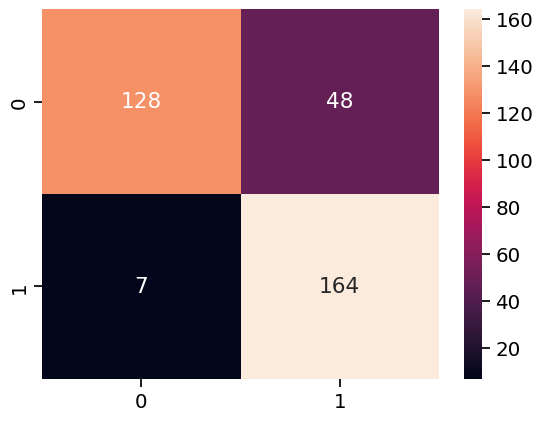

In [153]:
word2vec=evaluate_model(model, X_test_padded, y_test)
word2vec

##  Bidirectional LSTM with our trained fasttext Emmbedded Vector

In [154]:
model = Sequential()
model.add(Embedding(
                   input_dim=emmbedded_matrix_traind_fasttext.shape[0], 
                   output_dim=emmbedded_matrix_traind_fasttext.shape[1],
                   weights=[emmbedded_matrix_traind_fasttext],trainable=False,
                   input_length=80)
         )
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(Bidirectional(LSTM(100, return_sequences=True, recurrent_dropout=0.15)))
model.add(GlobalMaxPool1D())
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(100, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, 80, 100)           222400    
                                                                 
 bidirectional_12 (Bidirect  (None, 80, 200)           160800    
 ional)                                                          
                                                                 
 bidirectional_13 (Bidirect  (None, 80, 200)           240800    
 ional)                                                          
                                                                 
 bidirectional_14 (Bidirect  (None, 80, 200)           240800    
 ional)                                                          
                                                                 
 global_max_pooling1d_4 (Gl  (None, 200)               0         
 obalMaxPooling1D)                                    

In [155]:

checkpoints = ModelCheckpoint('ck_model.h5', monitor='val_loss', verbose=1, save_best_only=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', vactor=0.1, verbose=1, patience=5, min_lr=0.0001)
history = model.fit(X_train_padded, y_train, epochs=10, batch_size=32, validation_data=(X_test_padded, y_test), verbose=1, callbacks=[reduce_lr, checkpoints])

Epoch 1/10
44/44 [==============================] - ETA: 0s - loss: 0.4659 - accuracy: 0.7918
Epoch 1: val_loss improved from inf to 0.59772, saving model to ck_model.h5
44/44 [==============================] - 34s 472ms/step - loss: 0.4659 - accuracy: 0.7918 - val_loss: 0.5977 - val_accuracy: 0.8156 - lr: 0.0010
Epoch 2/10


You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.


44/44 [==============================] - ETA: 0s - loss: 0.3735 - accuracy: 0.8501
Epoch 2: val_loss did not improve from 0.59772
44/44 [==============================] - 10s 224ms/step - loss: 0.3735 - accuracy: 0.8501 - val_loss: 0.6014 - val_accuracy: 0.8098 - lr: 0.0010
Epoch 3/10
44/44 [==============================] - ETA: 0s - loss: 0.3600 - accuracy: 0.8552
Epoch 3: val_loss improved from 0.59772 to 0.52005, saving model to ck_model.h5
44/44 [==============================] - 7s 162ms/step - loss: 0.3600 - accuracy: 0.8552 - val_loss: 0.5201 - val_accuracy: 0.8415 - lr: 0.0010
Epoch 4/10
44/44 [==============================] - ETA: 0s - loss: 0.3434 - accuracy: 0.8537
Epoch 4: val_loss improved from 0.52005 to 0.51560, saving model to ck_model.h5
44/44 [==============================] - 8s 178ms/step - loss: 0.3434 - accuracy: 0.8537 - val_loss: 0.5156 - val_accuracy: 0.8357 - lr: 0.0010
Epoch 5/10
44/44 [==============================] - ETA: 0s - loss: 0.3362 - accuracy: 0.

11/11 [==============================] - 2s 79ms/step


{'accuracy': 0.7262247838616714,
 'precision': 0.9871794871794872,
 'recall': 0.4502923976608187,
 'f1-score': 0.6184738955823293}

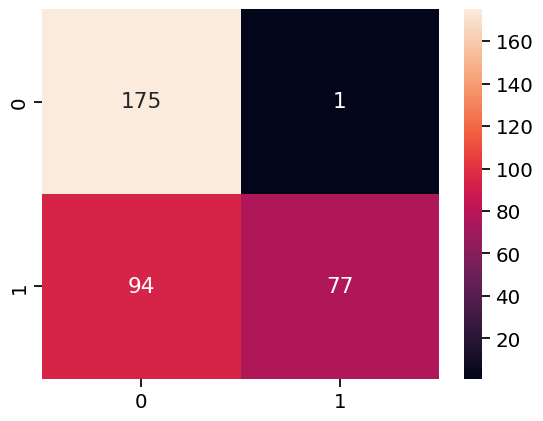

In [156]:
fasttext=evaluate_model(model, X_test_padded, y_test)
fasttext

In [157]:
total_results1 = pd.DataFrame({'pretrained_GLove':pretrained_GLove,
							 'pretrained_word2vec':pretrained_word2vec,
							 'pretrained_fasttext':pretrained_fasttext,
                             "word2vec":word2vec,
                             "fasttext":fasttext
							 }).transpose()
total_results1



,accuracy,precision,recall,f1-score
pretrained_GLove,0.821326,0.957983,0.666667,0.786207
pretrained_word2vec,0.864553,0.924658,0.789474,0.851735
pretrained_fasttext,0.703170,0.627820,0.976608,0.764302
word2vec,0.841499,0.773585,0.959064,0.856397
fasttext,0.726225,0.987179,0.450292,0.618474


##  CNN with pretrained Glove Emmbedded Vector

In [158]:
from keras.layers import Conv1D, MaxPool1D, GlobalMaxPooling1D, GlobalAveragePooling1D

In [159]:


model3 = Sequential()
model3.add(Embedding(input_dim=embedding_matrix_glove.shape[0], 
                   output_dim=embedding_matrix_glove.shape[1],
                    weights=[embedding_matrix_glove],input_length=80,))
model3.add(Conv1D(128, 3, activation='relu'))
model3.add(MaxPool1D(3))
model3.add(Dropout(0.2))
model3.add(Conv1D(128, 3, activation='relu'))
model3.add(GlobalMaxPooling1D())
model3.add(Dropout(0.2))
model3.add(Dense(64, activation='relu'))
model3.add(Dropout(0.2))
model3.add(Dense(32, activation='relu'))
model3.add(Dropout(0.2))

model3.add(Dense(1, activation='sigmoid'))


In [160]:
model3.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])
result3 = model3.fit(X_train_padded, y_train, batch_size = 32, epochs=25, validation_split=0.2, verbose=1)

Epoch 1/25
35/35 [==============================] - 2s 28ms/step - loss: 0.6421 - accuracy: 0.6216 - val_loss: 0.5243 - val_accuracy: 0.7374
Epoch 2/25
35/35 [==============================] - 1s 21ms/step - loss: 0.4673 - accuracy: 0.7721 - val_loss: 0.3752 - val_accuracy: 0.8345
Epoch 3/25
35/35 [==============================] - 1s 22ms/step - loss: 0.2878 - accuracy: 0.8721 - val_loss: 0.3375 - val_accuracy: 0.8417
Epoch 4/25
35/35 [==============================] - 1s 22ms/step - loss: 0.2098 - accuracy: 0.9171 - val_loss: 0.3848 - val_accuracy: 0.8597
Epoch 5/25
35/35 [==============================] - 1s 21ms/step - loss: 0.1204 - accuracy: 0.9514 - val_loss: 0.4373 - val_accuracy: 0.8777
Epoch 6/25
35/35 [==============================] - 1s 21ms/step - loss: 0.0844 - accuracy: 0.9784 - val_loss: 0.4255 - val_accuracy: 0.8633
Epoch 7/25
35/35 [==============================] - 1s 21ms/step - loss: 0.0617 - accuracy: 0.9847 - val_loss: 0.6901 - val_accuracy: 0.8237
Epoch 8/25
35

11/11 [==============================] - 0s 7ms/step


{'accuracy': 0.8933717579250721,
 'precision': 0.8850574712643678,
 'recall': 0.9005847953216374,
 'f1-score': 0.8927536231884058}

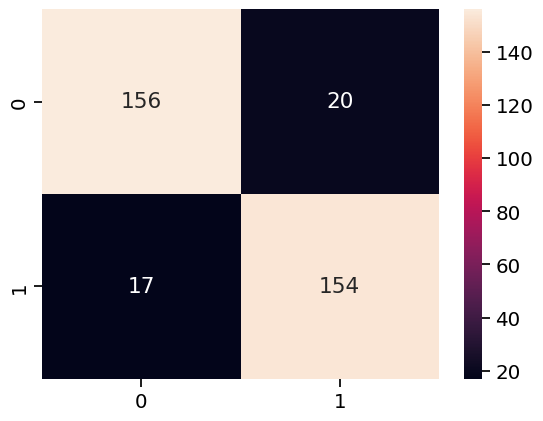

In [161]:
pretrained_GLove=evaluate_model(model3, X_test_padded, y_test)
pretrained_GLove

##  CNN with pretrained Fasttext Emmbedded Vector

In [162]:

model3 = Sequential()
model3.add(Embedding(
                   input_dim=emmbedded_matrix_pre_traind_fast.shape[0], 
                   output_dim=emmbedded_matrix_pre_traind_fast.shape[1],
                   weights=[emmbedded_matrix_pre_traind_fast],trainable=False,
                   input_length=80)
         )
model3.add(Conv1D(128, 3, activation='relu'))
model3.add(MaxPool1D(3))
model3.add(Dropout(0.2))
model3.add(Conv1D(128, 3, activation='relu'))
model3.add(GlobalMaxPooling1D())
model3.add(Dropout(0.2))
model3.add(Dense(64, activation='relu'))
model3.add(Dropout(0.2))
model3.add(Dense(32, activation='relu'))
model3.add(Dropout(0.2))

model3.add(Dense(1, activation='sigmoid'))


In [163]:
model3.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])
result3 = model3.fit(X_train_padded, y_train, batch_size = 32, epochs=25, validation_split=0.2, verbose=1)

Epoch 1/25
35/35 [==============================] - 2s 32ms/step - loss: 0.6151 - accuracy: 0.6523 - val_loss: 0.5581 - val_accuracy: 0.7122
Epoch 2/25
35/35 [==============================] - 1s 20ms/step - loss: 0.5040 - accuracy: 0.7459 - val_loss: 0.5219 - val_accuracy: 0.7086
Epoch 3/25
35/35 [==============================] - 1s 20ms/step - loss: 0.4033 - accuracy: 0.8108 - val_loss: 0.4878 - val_accuracy: 0.7806
Epoch 4/25
35/35 [==============================] - 1s 19ms/step - loss: 0.2859 - accuracy: 0.8667 - val_loss: 0.5943 - val_accuracy: 0.7878
Epoch 5/25
35/35 [==============================] - 1s 19ms/step - loss: 0.2341 - accuracy: 0.9009 - val_loss: 0.6011 - val_accuracy: 0.7986
Epoch 6/25
35/35 [==============================] - 1s 19ms/step - loss: 0.1354 - accuracy: 0.9613 - val_loss: 0.7446 - val_accuracy: 0.8273
Epoch 7/25
35/35 [==============================] - 1s 21ms/step - loss: 0.1198 - accuracy: 0.9685 - val_loss: 0.9372 - val_accuracy: 0.8094
Epoch 8/25
35

11/11 [==============================] - 0s 6ms/step


{'accuracy': 0.8472622478386167,
 'precision': 0.8352272727272727,
 'recall': 0.8596491228070176,
 'f1-score': 0.8472622478386167}

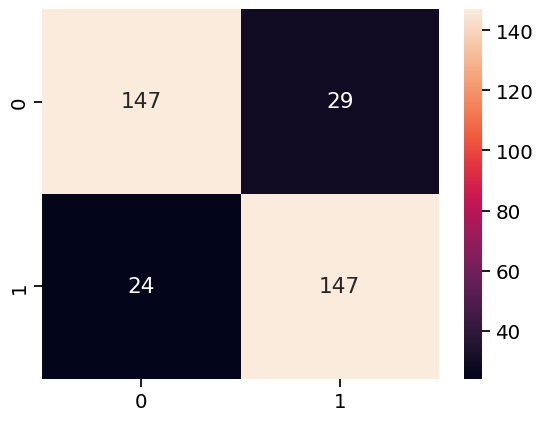

In [164]:
pretrained_fasttext=evaluate_model(model3, X_test_padded, y_test)
pretrained_fasttext

##  CNN with pretrained w2vec Emmbedded Vector

In [165]:
model3 = Sequential()
model3.add(Embedding(
                   input_dim=emmbedded_matrix_pre_traind_w2vec.shape[0], 
                   output_dim=emmbedded_matrix_pre_traind_w2vec.shape[1],
                   weights=[emmbedded_matrix_pre_traind_w2vec],trainable=False,
                   input_length=80)
         )
model3.add(Conv1D(128, 3, activation='relu'))
model3.add(MaxPool1D(3))
model3.add(Dropout(0.2))
model3.add(Conv1D(128, 3, activation='relu'))
model3.add(GlobalMaxPooling1D())
model3.add(Dropout(0.2))
model3.add(Dense(64, activation='relu'))
model3.add(Dropout(0.2))
model3.add(Dense(32, activation='relu'))
model3.add(Dropout(0.2))

model3.add(Dense(1, activation='sigmoid'))


In [166]:
model3.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])
result3 = model3.fit(X_train_padded, y_train, batch_size = 32, epochs=25, validation_split=0.2, verbose=1)

Epoch 1/25
35/35 [==============================] - 2s 28ms/step - loss: 0.6003 - accuracy: 0.6820 - val_loss: 0.4605 - val_accuracy: 0.7914
Epoch 2/25
35/35 [==============================] - 1s 19ms/step - loss: 0.3694 - accuracy: 0.8432 - val_loss: 0.3346 - val_accuracy: 0.8633
Epoch 3/25
35/35 [==============================] - 1s 19ms/step - loss: 0.2196 - accuracy: 0.9081 - val_loss: 0.3602 - val_accuracy: 0.8741
Epoch 4/25
35/35 [==============================] - 1s 19ms/step - loss: 0.1346 - accuracy: 0.9387 - val_loss: 0.3952 - val_accuracy: 0.8741
Epoch 5/25
35/35 [==============================] - 1s 20ms/step - loss: 0.1096 - accuracy: 0.9459 - val_loss: 0.4614 - val_accuracy: 0.8669
Epoch 6/25
35/35 [==============================] - 1s 23ms/step - loss: 0.0929 - accuracy: 0.9631 - val_loss: 0.4693 - val_accuracy: 0.8813
Epoch 7/25
35/35 [==============================] - 1s 20ms/step - loss: 0.0753 - accuracy: 0.9766 - val_loss: 0.5062 - val_accuracy: 0.8957
Epoch 8/25
35

11/11 [==============================] - 0s 6ms/step


{'accuracy': 0.8904899135446686,
 'precision': 0.8556149732620321,
 'recall': 0.935672514619883,
 'f1-score': 0.893854748603352}

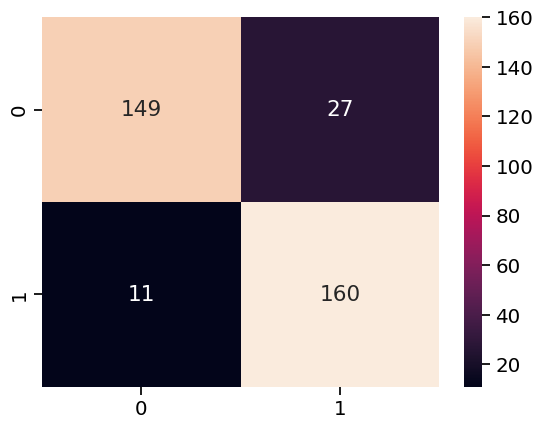

In [167]:
pretrained_word2vec=evaluate_model(model3, X_test_padded, y_test)
pretrained_word2vec

##  CNN with our trained w2vec Emmbedded Vector

In [168]:
model3 = Sequential()
model3.add(Embedding(
                   input_dim=emmbedded_matrix_traind_w2vec.shape[0], 
                   output_dim=emmbedded_matrix_traind_w2vec.shape[1],
                   weights=[emmbedded_matrix_traind_w2vec],trainable=False,
                   input_length=80)
         )
model3.add(Conv1D(128, 3, activation='relu'))
model3.add(MaxPool1D(3))
model3.add(Dropout(0.2))
model3.add(Conv1D(128, 3, activation='relu'))
model3.add(GlobalMaxPooling1D())
model3.add(Dropout(0.2))
model3.add(Dense(64, activation='relu'))
model3.add(Dropout(0.2))
model3.add(Dense(32, activation='relu'))
model3.add(Dropout(0.2))

model3.add(Dense(1, activation='sigmoid'))


In [169]:
model3.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])
result3 = model3.fit(X_train_padded, y_train, batch_size = 32, epochs=25, validation_split=0.2, verbose=1)

Epoch 1/25
35/35 [==============================] - 2s 19ms/step - loss: 0.6531 - accuracy: 0.5883 - val_loss: 0.6358 - val_accuracy: 0.6583
Epoch 2/25
35/35 [==============================] - 0s 12ms/step - loss: 0.6412 - accuracy: 0.6333 - val_loss: 0.6218 - val_accuracy: 0.6835
Epoch 3/25
35/35 [==============================] - 0s 13ms/step - loss: 0.6261 - accuracy: 0.6613 - val_loss: 0.6895 - val_accuracy: 0.5755
Epoch 4/25
35/35 [==============================] - 0s 12ms/step - loss: 0.6110 - accuracy: 0.6721 - val_loss: 0.5734 - val_accuracy: 0.7158
Epoch 5/25
35/35 [==============================] - 0s 12ms/step - loss: 0.5636 - accuracy: 0.7243 - val_loss: 0.5587 - val_accuracy: 0.7014
Epoch 6/25
35/35 [==============================] - 0s 12ms/step - loss: 0.5248 - accuracy: 0.7514 - val_loss: 0.4838 - val_accuracy: 0.8058
Epoch 7/25
35/35 [==============================] - 0s 12ms/step - loss: 0.4838 - accuracy: 0.7766 - val_loss: 0.4341 - val_accuracy: 0.8129
Epoch 8/25
35

11/11 [==============================] - 0s 3ms/step


{'accuracy': 0.8501440922190202,
 'precision': 0.9280575539568345,
 'recall': 0.7543859649122807,
 'f1-score': 0.832258064516129}

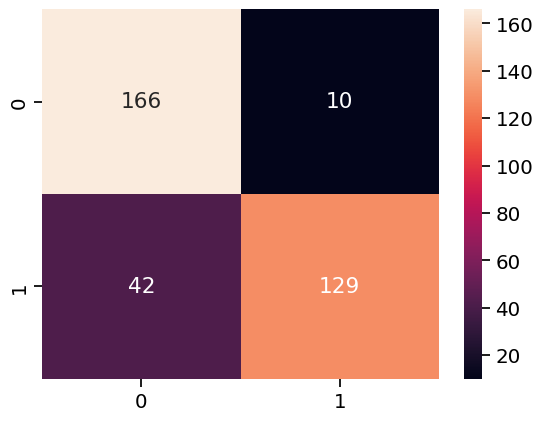

In [170]:
word2vec=evaluate_model(model3, X_test_padded, y_test)
word2vec

##  CNN with our trained fasttext Emmbedded Vector

In [171]:
model3 = Sequential()
model3.add(Embedding(
                   input_dim=emmbedded_matrix_traind_fasttext.shape[0], 
                   output_dim=emmbedded_matrix_traind_fasttext.shape[1],
                   weights=[emmbedded_matrix_traind_fasttext],trainable=False,
                   input_length=80)
         )
model3.add(Conv1D(128, 3, activation='relu'))
model3.add(MaxPool1D(3))
model3.add(Dropout(0.2))
model3.add(Conv1D(128, 3, activation='relu'))
model3.add(GlobalMaxPooling1D())
model3.add(Dropout(0.2))
model3.add(Dense(64, activation='relu'))
model3.add(Dropout(0.2))
model3.add(Dense(32, activation='relu'))
model3.add(Dropout(0.2))

model3.add(Dense(1, activation='sigmoid'))


In [172]:
model3.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])
result3 = model3.fit(X_train_padded, y_train, batch_size = 32, epochs=25, validation_split=0.2, verbose=1)

Epoch 1/25
35/35 [==============================] - 2s 27ms/step - loss: 0.6154 - accuracy: 0.6523 - val_loss: 0.4598 - val_accuracy: 0.8094
Epoch 2/25
35/35 [==============================] - 0s 12ms/step - loss: 0.4438 - accuracy: 0.8000 - val_loss: 0.3645 - val_accuracy: 0.8417
Epoch 3/25
35/35 [==============================] - 0s 12ms/step - loss: 0.3864 - accuracy: 0.8306 - val_loss: 0.3540 - val_accuracy: 0.8417
Epoch 4/25
35/35 [==============================] - 0s 13ms/step - loss: 0.3560 - accuracy: 0.8432 - val_loss: 0.3471 - val_accuracy: 0.8525
Epoch 5/25
35/35 [==============================] - 0s 12ms/step - loss: 0.3528 - accuracy: 0.8432 - val_loss: 0.3450 - val_accuracy: 0.8453
Epoch 6/25
35/35 [==============================] - 0s 13ms/step - loss: 0.3417 - accuracy: 0.8505 - val_loss: 0.3376 - val_accuracy: 0.8561
Epoch 7/25
35/35 [==============================] - 0s 12ms/step - loss: 0.3197 - accuracy: 0.8514 - val_loss: 0.3683 - val_accuracy: 0.8345
Epoch 8/25
35

11/11 [==============================] - 1s 5ms/step


{'accuracy': 0.8904899135446686,
 'precision': 0.8757062146892656,
 'recall': 0.9064327485380117,
 'f1-score': 0.8908045977011494}

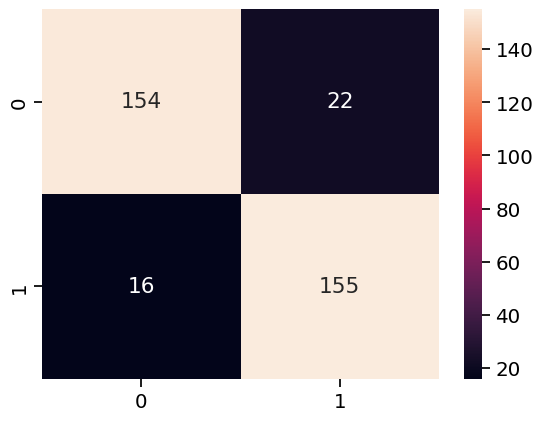

In [173]:
fasttext=evaluate_model(model3, X_test_padded, y_test)
fasttext

In [174]:
total_results2 = pd.DataFrame({'pretrained_GLove':pretrained_GLove,
							 'pretrained_word2vec':pretrained_word2vec,
							 'pretrained_fasttext':pretrained_fasttext,
                             "word2vec":word2vec,
                             "fasttext":fasttext
							 }).transpose()
total_results2


,accuracy,precision,recall,f1-score
pretrained_GLove,0.893372,0.885057,0.900585,0.892754
pretrained_word2vec,0.890490,0.855615,0.935673,0.893855
pretrained_fasttext,0.847262,0.835227,0.859649,0.847262
word2vec,0.850144,0.928058,0.754386,0.832258
fasttext,0.890490,0.875706,0.906433,0.890805


##  ANN with pretrained Glove Emmbedded Vector

In [175]:
model=Sequential()
model.add(Embedding(input_dim=embedding_matrix_glove.shape[0], 
                   output_dim=embedding_matrix_glove.shape[1],weights=[embedding_matrix_glove],trainable=False,
                input_length=80))
model.add(Flatten())
model.add(Dense(50,activation="leaky_relu"))

model.add(BatchNormalization())
model.add(Dense(25,activation="leaky_relu"))

model.add(BatchNormalization())


model.add(Dense(1,activation="sigmoid"))
model.summary()


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_10 (Embedding)    (None, 80, 200)           444800    
                                                                 
 flatten (Flatten)           (None, 16000)             0         
                                                                 
 dense_30 (Dense)            (None, 50)                800050    
                                                                 
 batch_normalization_5 (Bat  (None, 50)                200       
 chNormalization)                                                
                                                                 
 dense_31 (Dense)            (None, 25)                1275      
                                                                 
 batch_normalization_6 (Bat  (None, 25)                100       
 chNormalization)                                    

In [176]:
model.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])

In [177]:
model.fit(X_train_padded, y_train, batch_size = 32, epochs=10, validation_split=0.2, verbose=1)

Epoch 1/10


35/35 [==============================] - 2s 24ms/step - loss: 0.4844 - accuracy: 0.7640 - val_loss: 0.5275 - val_accuracy: 0.7842
Epoch 2/10
35/35 [==============================] - 0s 9ms/step - loss: 0.2661 - accuracy: 0.8856 - val_loss: 0.4745 - val_accuracy: 0.8058
Epoch 3/10
35/35 [==============================] - 0s 9ms/step - loss: 0.2257 - accuracy: 0.9063 - val_loss: 0.4478 - val_accuracy: 0.8094
Epoch 4/10
35/35 [==============================] - 0s 9ms/step - loss: 0.1786 - accuracy: 0.9333 - val_loss: 0.4453 - val_accuracy: 0.8058
Epoch 5/10
35/35 [==============================] - 0s 9ms/step - loss: 0.1504 - accuracy: 0.9387 - val_loss: 0.4232 - val_accuracy: 0.8237
Epoch 6/10
35/35 [==============================] - 0s 10ms/step - loss: 0.1309 - accuracy: 0.9459 - val_loss: 0.4466 - val_accuracy: 0.8094
Epoch 7/10
35/35 [==============================] - 0s 9ms/step - loss: 0.1191 - accuracy: 0.9532 - val_loss: 0.4505 - val_accuracy: 0.8022
Epoch 8/10
35/35 [===========

11/11 [==============================] - 0s 3ms/step


{'accuracy': 0.8184438040345822,
 'precision': 0.7842105263157895,
 'recall': 0.8713450292397661,
 'f1-score': 0.8254847645429363}

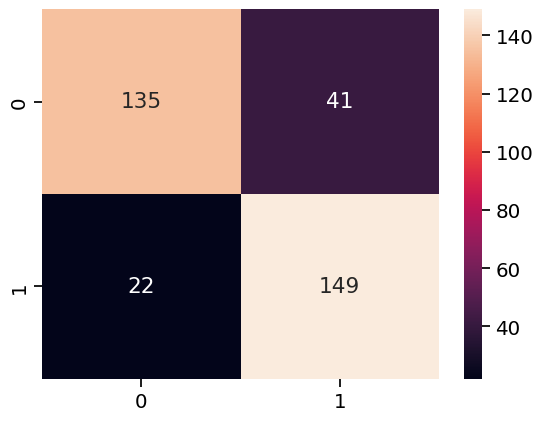

In [178]:
pretrained_GLove=evaluate_model(model, X_test_padded, y_test)
pretrained_GLove


##  ANN with pretrained w2vec Emmbedded Vector

In [179]:
model=Sequential()
model.add(Embedding(input_dim=emmbedded_matrix_pre_traind_w2vec.shape[0], 
                   output_dim=emmbedded_matrix_pre_traind_w2vec.shape[1],weights=[emmbedded_matrix_pre_traind_w2vec],trainable=False,
                input_length=80))
model.add(Flatten())
model.add(Dense(50,activation="leaky_relu"))

model.add(BatchNormalization())
model.add(Dense(25,activation="leaky_relu"))

model.add(BatchNormalization())


model.add(Dense(1,activation="sigmoid"))
model.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_11 (Embedding)    (None, 80, 300)           667200    
                                                                 
 flatten_1 (Flatten)         (None, 24000)             0         
                                                                 
 dense_33 (Dense)            (None, 50)                1200050   
                                                                 
 batch_normalization_7 (Bat  (None, 50)                200       
 chNormalization)                                                
                                                                 
 dense_34 (Dense)            (None, 25)                1275      
                                                                 
 batch_normalization_8 (Bat  (None, 25)                100       
 chNormalization)                                    

In [180]:
model.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])
model.fit(X_train_padded, y_train, batch_size = 32, epochs=10, validation_split=0.2, verbose=1)


Epoch 1/10
35/35 [==============================] - 2s 24ms/step - loss: 0.4452 - accuracy: 0.8018 - val_loss: 0.5461 - val_accuracy: 0.8417
Epoch 2/10
35/35 [==============================] - 0s 12ms/step - loss: 0.2228 - accuracy: 0.9306 - val_loss: 0.4887 - val_accuracy: 0.8453
Epoch 3/10
35/35 [==============================] - 0s 13ms/step - loss: 0.1465 - accuracy: 0.9523 - val_loss: 0.4405 - val_accuracy: 0.8741
Epoch 4/10
35/35 [==============================] - 0s 12ms/step - loss: 0.1239 - accuracy: 0.9577 - val_loss: 0.4140 - val_accuracy: 0.8669
Epoch 5/10
35/35 [==============================] - 0s 13ms/step - loss: 0.1025 - accuracy: 0.9721 - val_loss: 0.3917 - val_accuracy: 0.8705
Epoch 6/10
35/35 [==============================] - 0s 12ms/step - loss: 0.0799 - accuracy: 0.9757 - val_loss: 0.3995 - val_accuracy: 0.8561
Epoch 7/10
35/35 [==============================] - 0s 13ms/step - loss: 0.0764 - accuracy: 0.9793 - val_loss: 0.3947 - val_accuracy: 0.8453
Epoch 8/10
35

11/11 [==============================] - 0s 4ms/step


{'accuracy': 0.8645533141210374,
 'precision': 0.8604651162790697,
 'recall': 0.8654970760233918,
 'f1-score': 0.8629737609329445}

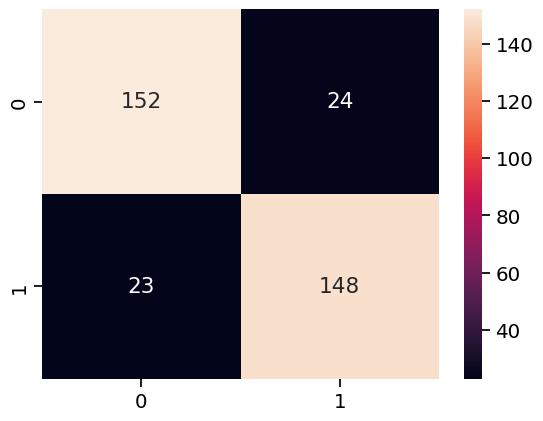

In [181]:
pretrained_word2vec=evaluate_model(model, X_test_padded, y_test)
pretrained_word2vec

##  ANN with pretrained fasttext Emmbedded Vector

In [182]:
model=Sequential()
model.add(Embedding(input_dim=emmbedded_matrix_pre_traind_fast.shape[0], 
                   output_dim=emmbedded_matrix_pre_traind_fast.shape[1],weights=[emmbedded_matrix_pre_traind_fast],trainable=False,
                input_length=80))
model.add(Flatten())
model.add(Dense(50,activation="leaky_relu"))
model.add(BatchNormalization())
model.add(Dense(25,activation="leaky_relu"))
model.add(BatchNormalization())
model.add(Dense(1,activation="sigmoid"))
model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_12 (Embedding)    (None, 80, 300)           667200    
                                                                 
 flatten_2 (Flatten)         (None, 24000)             0         
                                                                 
 dense_36 (Dense)            (None, 50)                1200050   
                                                                 
 batch_normalization_9 (Bat  (None, 50)                200       
 chNormalization)                                                
                                                                 
 dense_37 (Dense)            (None, 25)                1275      
                                                                 
 batch_normalization_10 (Ba  (None, 25)                100       
 tchNormalization)                                   

In [183]:
model.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])
model.fit(X_train_padded, y_train, batch_size = 32, epochs=10, validation_split=0.2, verbose=1)

Epoch 1/10
35/35 [==============================] - 2s 25ms/step - loss: 0.5793 - accuracy: 0.7486 - val_loss: 0.6153 - val_accuracy: 0.5899
Epoch 2/10
35/35 [==============================] - 0s 12ms/step - loss: 0.3206 - accuracy: 0.8712 - val_loss: 0.5661 - val_accuracy: 0.7374
Epoch 3/10
35/35 [==============================] - 0s 12ms/step - loss: 0.2515 - accuracy: 0.9000 - val_loss: 0.5309 - val_accuracy: 0.7626
Epoch 4/10
35/35 [==============================] - 0s 13ms/step - loss: 0.2039 - accuracy: 0.9252 - val_loss: 0.5120 - val_accuracy: 0.7914
Epoch 5/10
35/35 [==============================] - 0s 13ms/step - loss: 0.1690 - accuracy: 0.9423 - val_loss: 0.4928 - val_accuracy: 0.7914
Epoch 6/10
35/35 [==============================] - 0s 12ms/step - loss: 0.1645 - accuracy: 0.9441 - val_loss: 0.4769 - val_accuracy: 0.8022
Epoch 7/10
35/35 [==============================] - 0s 12ms/step - loss: 0.1257 - accuracy: 0.9622 - val_loss: 0.4901 - val_accuracy: 0.7986
Epoch 8/10
35

11/11 [==============================] - 0s 4ms/step


{'accuracy': 0.829971181556196,
 'precision': 0.8146067415730337,
 'recall': 0.847953216374269,
 'f1-score': 0.830945558739255}

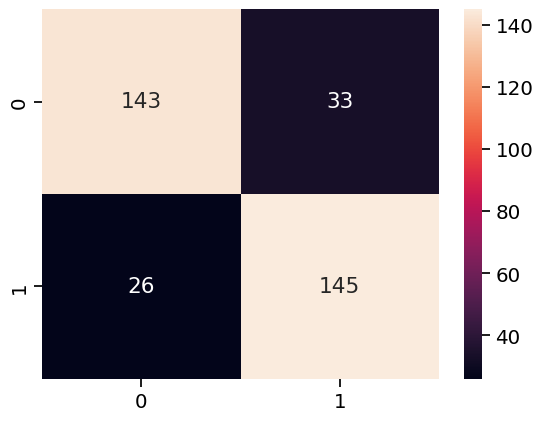

In [184]:
pretrained_fasttext=evaluate_model(model, X_test_padded, y_test)
pretrained_fasttext

##  ANN with our trained fastext Emmbedded Vector

In [185]:
model=Sequential()
model.add(Embedding(input_dim=emmbedded_matrix_traind_fasttext.shape[0], 
                   output_dim=emmbedded_matrix_traind_fasttext.shape[1],weights=[emmbedded_matrix_traind_fasttext],trainable=False,
                input_length=80))
model.add(Flatten())
model.add(Dense(50,activation="leaky_relu"))
model.add(BatchNormalization())
model.add(Dense(25,activation="leaky_relu"))
model.add(BatchNormalization())
model.add(Dense(1,activation="sigmoid"))
model.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_13 (Embedding)    (None, 80, 100)           222400    
                                                                 
 flatten_3 (Flatten)         (None, 8000)              0         
                                                                 
 dense_39 (Dense)            (None, 50)                400050    
                                                                 
 batch_normalization_11 (Ba  (None, 50)                200       
 tchNormalization)                                               
                                                                 
 dense_40 (Dense)            (None, 25)                1275      
                                                                 
 batch_normalization_12 (Ba  (None, 25)                100       
 tchNormalization)                                   

In [186]:
model.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])
model.fit(X_train_padded, y_train, batch_size = 32, epochs=10, validation_split=0.2, verbose=1)

Epoch 1/10
35/35 [==============================] - 2s 19ms/step - loss: 0.4498 - accuracy: 0.7982 - val_loss: 0.5495 - val_accuracy: 0.8022
Epoch 2/10
35/35 [==============================] - 0s 6ms/step - loss: 0.3568 - accuracy: 0.8468 - val_loss: 0.5029 - val_accuracy: 0.7950
Epoch 3/10
35/35 [==============================] - 0s 5ms/step - loss: 0.3315 - accuracy: 0.8613 - val_loss: 0.4757 - val_accuracy: 0.8345
Epoch 4/10
35/35 [==============================] - 0s 6ms/step - loss: 0.3153 - accuracy: 0.8712 - val_loss: 0.4536 - val_accuracy: 0.8309
Epoch 5/10
35/35 [==============================] - 0s 6ms/step - loss: 0.3077 - accuracy: 0.8820 - val_loss: 0.4359 - val_accuracy: 0.8201
Epoch 6/10
35/35 [==============================] - 0s 5ms/step - loss: 0.3042 - accuracy: 0.8685 - val_loss: 0.4070 - val_accuracy: 0.8273
Epoch 7/10
35/35 [==============================] - 0s 6ms/step - loss: 0.2904 - accuracy: 0.8901 - val_loss: 0.3971 - val_accuracy: 0.8561
Epoch 8/10
35/35 [=

11/11 [==============================] - 0s 2ms/step


{'accuracy': 0.8587896253602305,
 'precision': 0.8860759493670886,
 'recall': 0.8187134502923976,
 'f1-score': 0.8510638297872339}

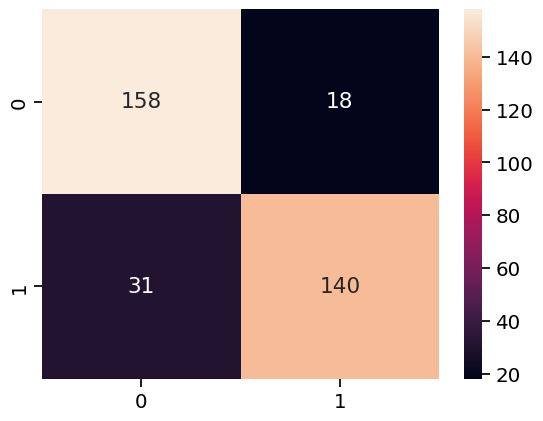

In [187]:
fasttext=evaluate_model(model, X_test_padded, y_test)
fasttext

##  ANN with our trained w2vec Emmbedded Vector

In [188]:
model=Sequential()
model.add(Embedding(input_dim=emmbedded_matrix_traind_w2vec.shape[0], 
                   output_dim=emmbedded_matrix_traind_w2vec.shape[1],weights=[emmbedded_matrix_traind_w2vec],trainable=False,
                input_length=80))
model.add(Flatten())
model.add(Dense(60,activation="leaky_relu"))
model.add(BatchNormalization())
model.add(Dense(20,activation="leaky_relu"))
model.add(BatchNormalization())
model.add(Dense(1,activation="sigmoid"))
model.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_14 (Embedding)    (None, 80, 100)           222400    
                                                                 
 flatten_4 (Flatten)         (None, 8000)              0         
                                                                 
 dense_42 (Dense)            (None, 60)                480060    
                                                                 
 batch_normalization_13 (Ba  (None, 60)                240       
 tchNormalization)                                               
                                                                 
 dense_43 (Dense)            (None, 20)                1220      
                                                                 
 batch_normalization_14 (Ba  (None, 20)                80        
 tchNormalization)                                   

In [189]:
model.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])
model.fit(X_train_padded, y_train, batch_size = 32, epochs=10, validation_split=0.2, verbose=1)

Epoch 1/10
35/35 [==============================] - 2s 19ms/step - loss: 0.6269 - accuracy: 0.6784 - val_loss: 0.6504 - val_accuracy: 0.6763
Epoch 2/10
35/35 [==============================] - 0s 6ms/step - loss: 0.5125 - accuracy: 0.7712 - val_loss: 0.6051 - val_accuracy: 0.7482
Epoch 3/10
35/35 [==============================] - 0s 6ms/step - loss: 0.4520 - accuracy: 0.7847 - val_loss: 0.5819 - val_accuracy: 0.7158
Epoch 4/10
35/35 [==============================] - 0s 7ms/step - loss: 0.4171 - accuracy: 0.8135 - val_loss: 0.5697 - val_accuracy: 0.6906
Epoch 5/10
35/35 [==============================] - 0s 6ms/step - loss: 0.3675 - accuracy: 0.8514 - val_loss: 0.5297 - val_accuracy: 0.7266
Epoch 6/10
35/35 [==============================] - 0s 6ms/step - loss: 0.3998 - accuracy: 0.8252 - val_loss: 0.5370 - val_accuracy: 0.7122
Epoch 7/10
35/35 [==============================] - 0s 7ms/step - loss: 0.3643 - accuracy: 0.8342 - val_loss: 0.4754 - val_accuracy: 0.7806
Epoch 8/10
35/35 [=

11/11 [==============================] - 0s 2ms/step


{'accuracy': 0.7838616714697406,
 'precision': 0.8380281690140845,
 'recall': 0.695906432748538,
 'f1-score': 0.7603833865814696}

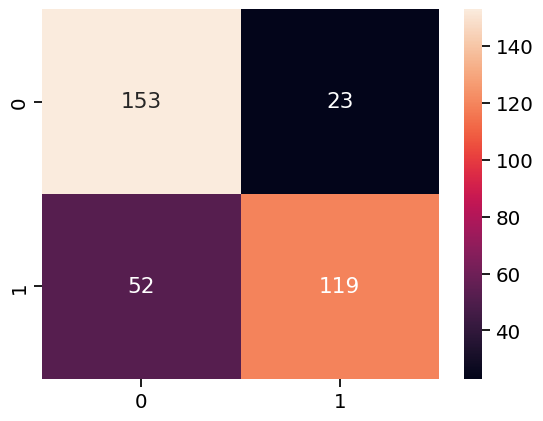

In [190]:
word2vec=evaluate_model(model, X_test_padded, y_test)
word2vec

In [203]:
total_results3 = pd.DataFrame({'pretrained_GLove':pretrained_GLove,
							 'pretrained_word2vec':pretrained_word2vec,
							 'pretrained_fasttext':pretrained_fasttext,
                             "word2vec":word2vec,
                             "fasttext":fasttext
							 }).transpose()
total_results3

,accuracy,precision,recall,f1-score
pretrained_GLove,0.818444,0.784211,0.871345,0.825485
pretrained_word2vec,0.864553,0.860465,0.865497,0.862974
pretrained_fasttext,0.829971,0.814607,0.847953,0.830946
word2vec,0.783862,0.838028,0.695906,0.760383
fasttext,0.858790,0.886076,0.818713,0.851064


In [205]:
df6=pd.concat([total_results1,total_results2])
df7=pd.concat([df6,total_results3])


df8 = df7.assign(models=["Bidirectional LSTM","Bidirectional LSTM","Bidirectional LSTM","Bidirectional LSTM","Bidirectional LSTM","CNN","CNN","CNN","CNN","CNN","ANN","ANN","ANN","ANN","ANN"])
df9=df8.assign(embedded=['pretrained_GLove', 'pretrained_word2vec', 'pretrained_fasttext',
       'word2vec', 'fasttext','pretrained_GLove', 'pretrained_word2vec', 'pretrained_fasttext',
       'word2vec', 'fasttext','pretrained_GLove', 'pretrained_word2vec', 'pretrained_fasttext',
       'word2vec', 'fasttext'])
df9.set_index(["models","embedded"])


accuracy  precision    recall  \
models             embedded                                             
Bidirectional LSTM pretrained_GLove     0.821326   0.957983  0.666667   
                   pretrained_word2vec  0.864553   0.924658  0.789474   
                   pretrained_fasttext  0.703170   0.627820  0.976608   
                   word2vec             0.841499   0.773585  0.959064   
                   fasttext             0.726225   0.987179  0.450292   
CNN                pretrained_GLove     0.893372   0.885057  0.900585   
                   pretrained_word2vec  0.890490   0.855615  0.935673   
                   pretrained_fasttext  0.847262   0.835227  0.859649   
                   word2vec             0.850144   0.928058  0.754386   
                   fasttext             0.890490   0.875706  0.906433   
ANN                pretrained_GLove     0.818444   0.784211  0.871345   
                   pretrained_word2vec  0.864553   0.860465  0.865497   
                   pretrained_fasttext  0.829971   0.814607  0.847953   
                   word2vec             0.783862   0.838028  0.695906   
                   fasttext             0.858790   0.886076  0.818713   

                                        f1-score  
models             embedded                       
Bidirectional LSTM pretrained_GLove     0.786207  
                   pretrained_word2vec  0.851735  
                   pretrained_fasttext  0.764302  
                   word2vec             0.856397  
                   fasttext             0.618474  
CNN                pretrained_GLove     0.892754  
                   pretrained_word2vec  0.893855  
                   pretrained_fasttext  0.847262  
                   word2vec             0.832258  
                   fasttext             0.890805  
ANN                pretrained_GLove     0.825485  
                   pretrained_word2vec  0.862974  
                   pretrained_fasttext  0.830946  
                   word2vec             0.760383  
                   fasttext             0.851064